In [1]:
import matplotlib.pyplot as plt
import skimage as sk
import numpy as np

In [2]:
from skimage.io import imread

In [3]:
doll   = imread('Dollar.jpg')
gray   = sk.color.rgb2gray(doll)
pad_im = np.pad(gray, 300, mode= 'edge')

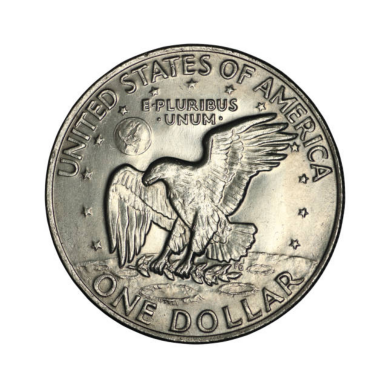

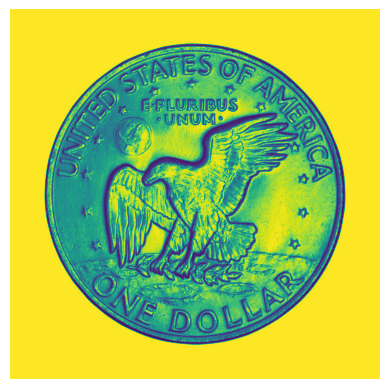

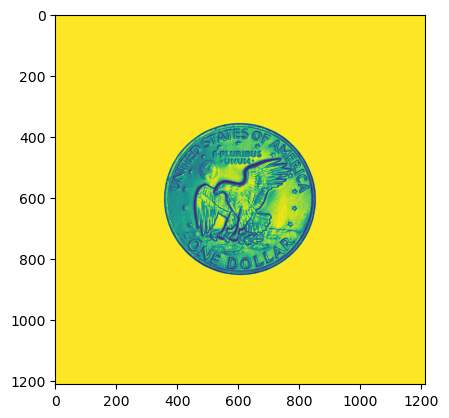

In [4]:
fig, ax = plt.subplots()
ax.imshow(doll);
ax.set_axis_off()

fig, ax = plt.subplots()
ax.imshow(gray);
ax.set_axis_off()

fig, ax = plt.subplots()
ax.imshow(pad_im);

In [5]:
from skimage.filters import gaussian
gauss_filt = gaussian(pad_im, sigma=15);

In [6]:
from skimage import filters
edges = filters.sobel(gauss_filt);

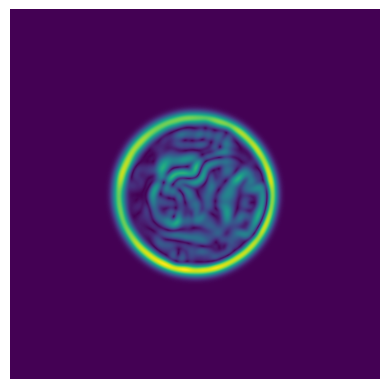

In [7]:
fig, ax = plt.subplots()
ax.imshow(edges);
ax.set_axis_off()

In [8]:
class control_point():
    def __init__(self, x: int, y: int, s: None, x_prim = 0, y_prim = 0):
        self.x = x
        self.y = y
        self.s = s
        self.x_prim = x
        self.y_prim = y

class contour():
    def __init__(self, list_contour):
        # control point list has to start and to end with the same 
        # control point (at least the same coordinate)
        if len(list_contour) > 2:
            self.contour =  list_contour
            if (self.contour[-1].x != self.contour[0].x or 
                self.contour[-1].y != self.contour[0].y):
                ctr_pnt_tmp = control_point(self.contour[0].x, self.contour[0].y, s = None, 
                                            x_prim=self.contour[0].x, y_prim=self.contour[0].y)
                self.contour.append(ctr_pnt_tmp)
            self.contour[0].s = 0   # init the curvilinear coordinate     
            self.compute_s()
            self.update_position_array()
        else:
            self.contour = []
          
    def update_position_array(self):
        "Update the array containing the positions x and y of the control points"
        x_array = []
        y_array = []
        for u in range(len(self.contour)-1):
            x_array.append(self.contour[u].x)
            y_array.append(self.contour[u].y)

        self.x_array, self.y_array = x_array, y_array
    
    def compute_s(self):
        "Compute curvilinear coordinate between control points, setting a line between them"
        if len(self.contour):
            for u in range(len(self.contour)-1):
                self.contour[u+1].s = self.contour[u].s + \
                                        np.sqrt((self.contour[u].x - self.contour[u+1].x )**2 +  \
                                                (self.contour[u].y - self.contour[u+1].y )**2)
    
    def resample_contour(self, number_points= None, fixed_length= None):
        """
        Resample uniformly the contour, either using a fixed number of points or using a fixed
        length.
        
        
        inputs:
            number of points: int
            fixed length: positive float (it has to be lower than the total length)
            only one of these two optional arguments must be non None.
            
        outputs:
            
            contour: new contour resampled.
        """
        if len(self.contour) and ((number_points is not None) ^ (fixed_length is not None)):
            tot_len = self.contour[-1].s
            if number_points:
                s_array = np.linspace(0, tot_len, number_points)
            else:
                s_array = np.arange(0, tot_len, fixed_length)  # check that fixed_length < tot_len
                
            new_list_contour = []
            for s in s_array:
                for u in range(len(self.contour)-1):
                    if self.contour[u].s <= s and s < self.contour[u+1].s:
                        x1, y1 = self.contour[u].x, self.contour[u].y
                        x2, y2 = self.contour[u+1].x, self.contour[u+1].y
                        s0     = self.contour[u].s
                        x3, y3 = self.interpolate_coordinates(x1, y1, x2, y2, s, s0)                                                
                        new_list_contour.append(control_point(x3, y3, None, 0, 0))
                        break
        
            return contour(new_list_contour)
        else:
            return contour([])
        
    def update_contour(self):
        "Update position of the control points (actual position <- next position)"
        if len(self.contour):
            for u in range(len(self.contour)-1):
                self.contour[u].x = self.contour[u].x_prim
                self.contour[u].y = self.contour[u].y_prim
                self.contour[u].x_prim = 0
                self.contour[u].y_prim = 0
                self.contour[0].s = 0
                self.compute_s()
                self.update_position_array()

    def compute_motion(self):
        "Compute an array of motion. For each control point, we compute the displacement between iterations."
        motion = [] 
        if len(self.contour): 
            for u in range(len(self.contour)-1):
                 motion.append(np.sqrt( (self.contour[u].x -  self.contour[u].x_prim)**2 + \
                                    (self.contour[u].y -  self.contour[u].y_prim)**2))
        return motion
    
    def compute_total_motion(self):
        "Sum of motions in every control point."
        return np.sum(self.compute_motion())
    
    def find_minimum_on_wind(self, win_hs: int, grad: np.ndarray, alpha: float, beta: float, 
                             start_a_b_after: int, iteration=0):
        """
        Do energy minimization to adjust the position of the contour. 
        The energy term is written as:
        E snake = E_image + alpha*E_elastic + beta*E_smooth
        
        E_image is the sum over the control points of the gradient of the image convolved with a Gaussian kernel.
              For each control point, this term comprises a scalar term sum over N-1 control points 
              (the gradients at the other points), and a local term wich, is a matrix of a window 
              on the gradient image around the control point treated.
 
        E_smooth and E_elastic are the sum over the control points of the second order derivative of the image convolved with a Gaussian kernel.
              For each control point, we evaluate the 
 
        
        """
        
        for ind_cp in range(len(contour_s.contour) - 1):  # contour_s.contour has N control points  + 1
        
            cp = self.contour[ind_cp]
            x, y = cp.x, cp.y
            x, y = self.clamp_coordinates(x, y, win_hs, np.shape(grad))

            # E image 
            wind = grad[y - win_hs: y + win_hs+1, x - win_hs: x + win_hs + 1].copy()
            for ind_cp2 in range(len(contour_s.contour) - 1):
                if ind_cp2 != ind_cp:
                    cp2 = self.contour[ind_cp2]
                    x2, y2 = cp2.x, cp2.y
                    wind += grad[y2, x2]
            
            # E elastic and E smooth
            E_elastic = np.zeros_like(wind)
            E_smooth  = np.zeros_like(wind)
            
            if start_a_b_after >= iteration:
                alpha_temp = alpha
                beta_temp  = beta
            else:
                alpha_temp = 0
                beta_temp  = 0
                
            if alpha_temp > 0 or beta_temp > 0:
                x_arr = np.arange(x - win_hs, x + win_hs + 1)
                y_arr = np.arange(y - win_hs, y + win_hs + 1)    
                X, Y  = np.meshgrid(x_arr, y_arr)    

                for ind_y, row in enumerate(X):
                    for ind_x, value in enumerate(row):
                        x_cp_test = X[ind_y, ind_x]
                        y_cp_test = Y[ind_y, ind_x]

                        x_array_temp = self.x_array.copy()    
                        y_array_temp = self.y_array.copy() 

                        x_array_temp[ind_cp] = x_cp_test
                        y_array_temp[ind_cp] = y_cp_test

                        E_elastic[ind_y, ind_x] = self.compute_elastic_energy(x_array_temp, y_array_temp)
                        E_smooth[ind_y, ind_x]  = self.compute_smooth_energy(x_array_temp, y_array_temp)
                
            min_y, min_x = np.unravel_index(np.argmin(-wind + alpha_temp*E_elastic + beta_temp*E_smooth), wind.shape)
            dy           = win_hs - min_y
            dx           = win_hs - min_x
            y_new        = int(y - dy)
            x_new        = int(x - dx)
            x_new, y_new = self.clamp_coordinates(x_new, y_new, win_hs, np.shape(grad))

            contour_s.contour[ind_cp].x_prim = x_new
            contour_s.contour[ind_cp].y_prim = y_new
            
    @staticmethod
    def clamp_coordinates(x, y, wind_hs, dims):
        "Clamp coordinates to stay in the image"
        if y <= win_hs:
            y = win_hs
        if x <= win_hs:
            x = win_hs
        dim_y = dims[0]
        dim_x = dims[1]
        if x + win_hs + 1 >= dim_x:
            x = dim_x - win_hs
        if y + win_hs + 1 >= dim_y:
            y = dim_y - win_hs
        return x, y
    
    @staticmethod    
    def interpolate_coordinates(x1, y1, x2, y2, s, s0):
        "interpolates the difference between s and s0 over the line (x1,y1) (x2,y2)"
        x3 = int((s-s0)*(x2 - x1)/np.sqrt( (x2 - x1)**2 + (y2 - y1)**2 ) + x1)
        y3 = int((s-s0)*(y2 - y1)/np.sqrt( (x2 - x1)**2 + (y2 - y1)**2 ) + y1)
        return x3, y3
    
    @staticmethod
    def compute_elastic_energy(x_array: np.ndarray, y_array: np.ndarray):
        "sum of squares of derivatives of the control points position"
        x_array2 = np.insert(x_array, 0, x_array[-1], axis=0)
        dx       = np.diff(x_array2)
        y_array2 = np.insert(y_array, 0, y_array[-1], axis=0)
        dy       = np.diff(y_array2)
    
        return  np.sum(dx**2 + dy**2)

    @staticmethod
    def compute_smooth_energy(x_array: np.ndarray, y_array: np.ndarray):
        "sum of squares of second derivatives of the control points position"
        x_array2 = np.insert(x_array, 0, x_array[-1], axis=0)
        dx       = np.diff(x_array2)
        dx2      = np.insert(dx, 0, dx[-1], axis=0)
        dx_sec   = np.diff(dx2)

        y_array2 = np.insert(y_array, 0, y_array[-1], axis=0)
        dy       = np.diff(y_array2)
        dy2      = np.insert(dy, 0, dy[-1], axis=0)
        dy_sec   = np.diff(dy2)
        
        y_array2 = np.insert(y_array, 0, y_array[-1], axis=0)
        dy       = np.diff(y_array2)
    
        return  np.sum(dx_sec**2 + dy_sec**2)
    

    def plot_contour(self, edges= None):
        if len(self.contour):
            fig, ax = plt.subplots()
            if isinstance(edges, np.ndarray):
                ax.imshow(edges)
            for u in range(len(self.contour)-1):
                x1, y1 = self.contour[u].x, self.contour[u].y
                x2, y2 = self.contour[u+1].x, self.contour[u+1].y
                ax.plot([x1, x2],[y1, y2], 'k')
            ax.set_axis_off()    
            return fig

In [133]:
# init contour with only 4 points
cp1 = control_point(x= 300, y=300, s = None)
cp2 = control_point(x= 900, y=300, s = None)
cp3 = control_point(x= 900, y=900, s = None)
cp4 = control_point(x= 300, y=900, s = None)

contour_s = contour([cp1, cp2, cp3, cp4])

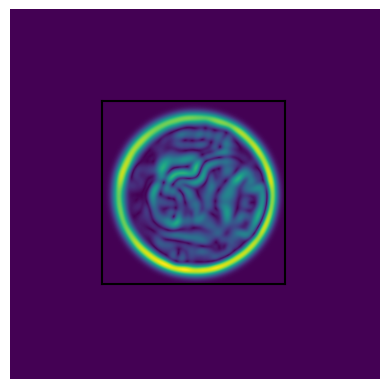

In [134]:
fig = contour_s.plot_contour(edges)
plt.show()

In [135]:
number_points = 40
contour_s     = contour_s.resample_contour(number_points= number_points, fixed_length=None)

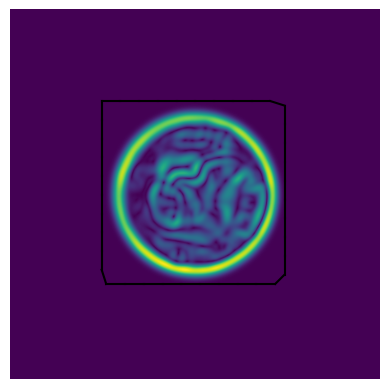

In [136]:
fig = contour_s.plot_contour(edges)
plt.show()

1577.8065943009578


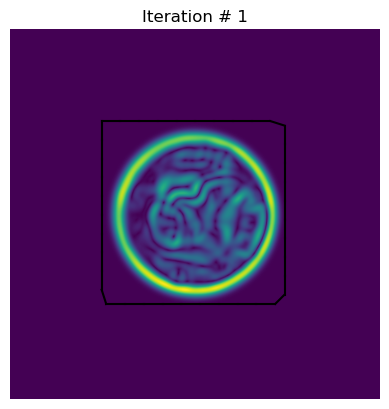

2071.150949111177


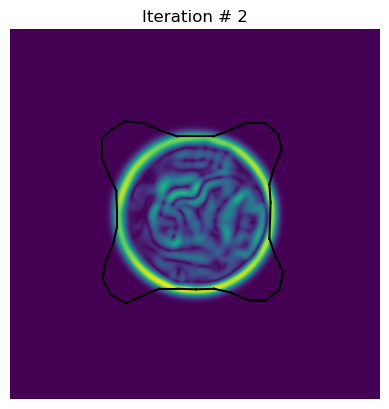

1711.5182735132116


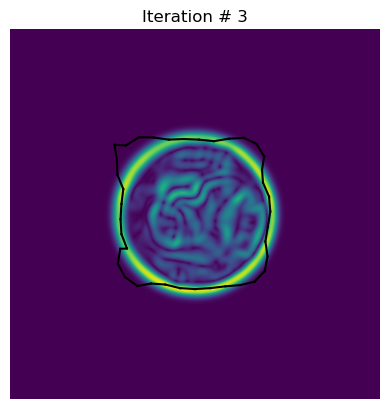

1657.083371894333


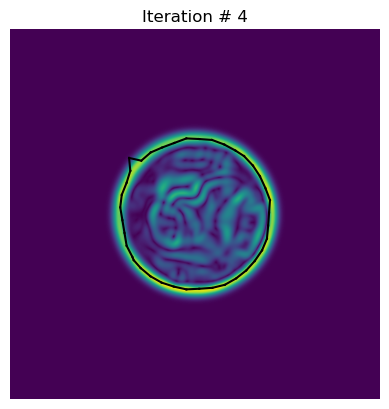

1614.1729353787741


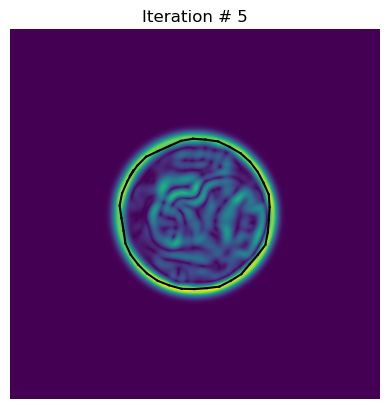

1526.1739731613156


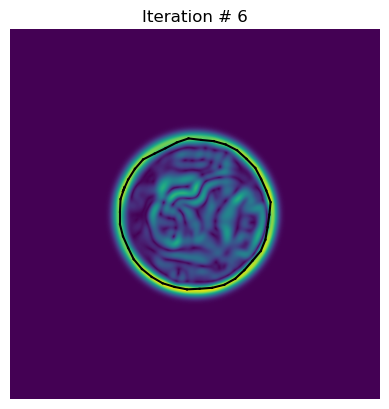

1598.0231265339003


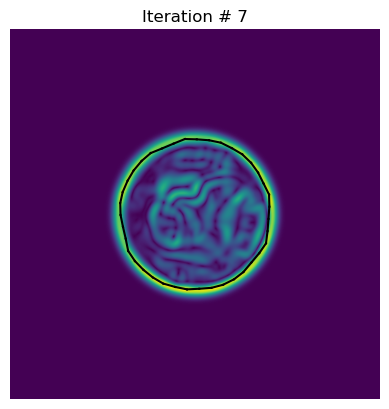

1587.0799793979365


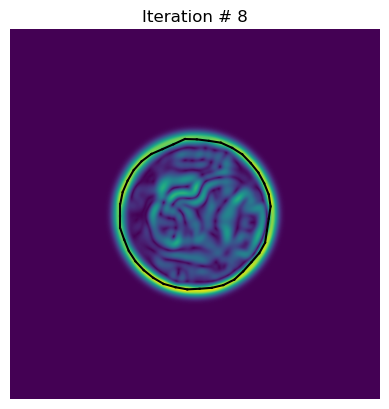

1590.0020601714539


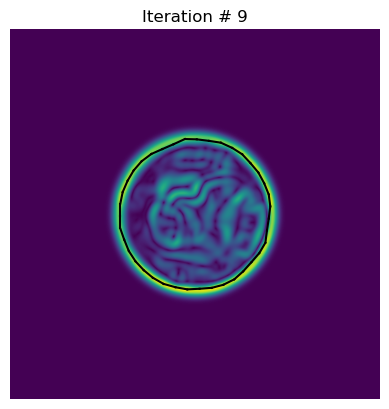

1588.910034526322


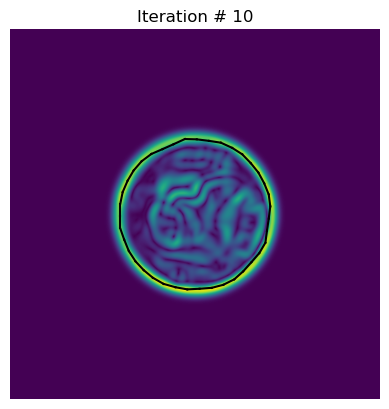

1590.0020601714539


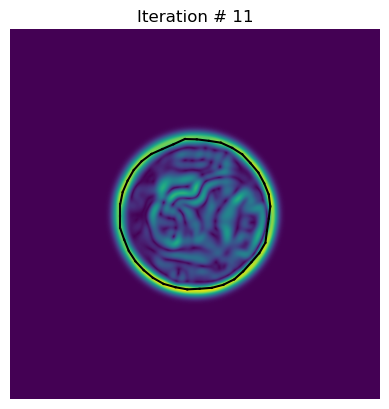

1588.910034526322


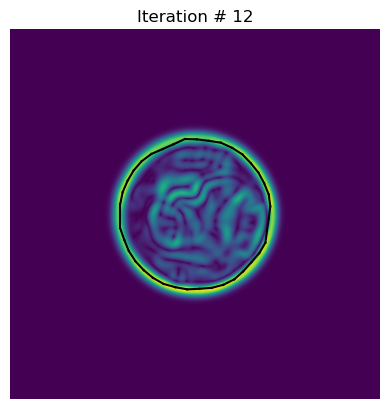

1590.0020601714539


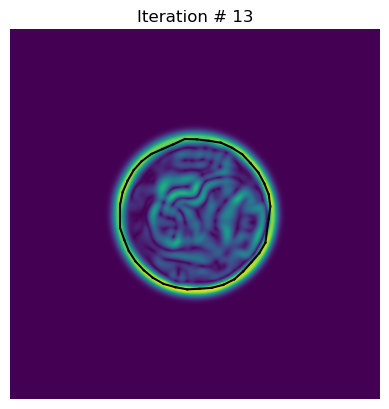

1588.910034526322


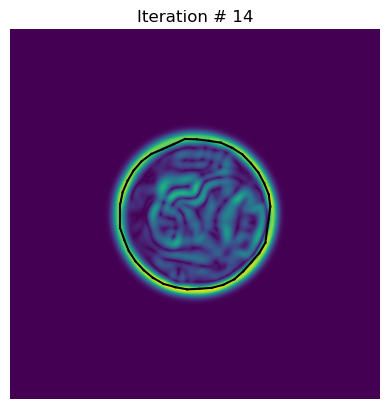

1590.0020601714539


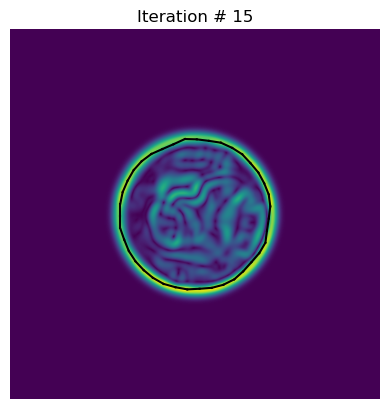

1588.910034526322


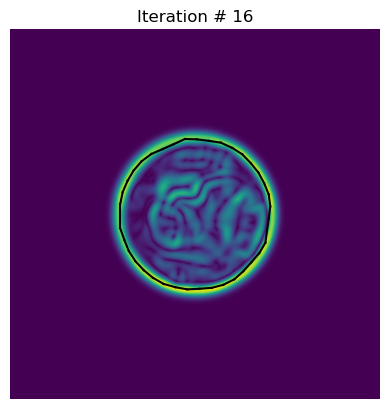

1590.0020601714539


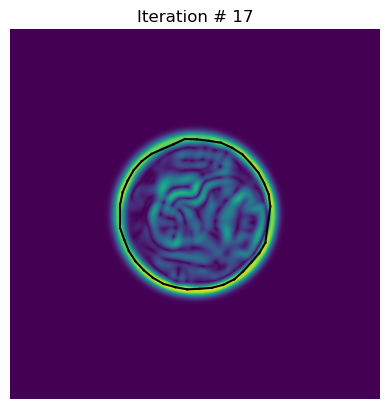

1588.910034526322


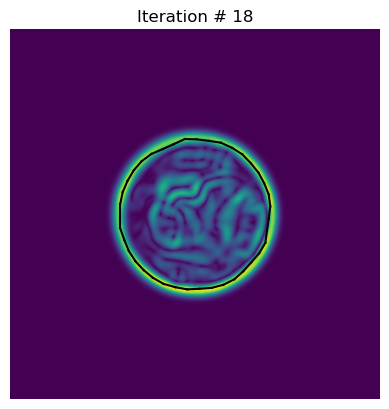

1590.0020601714539


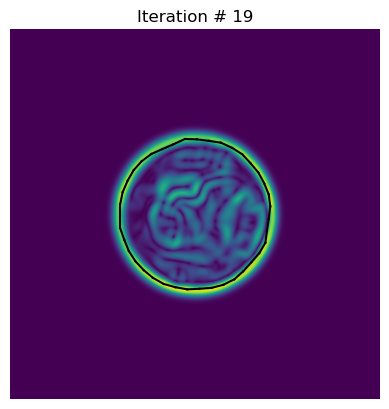

1588.910034526322


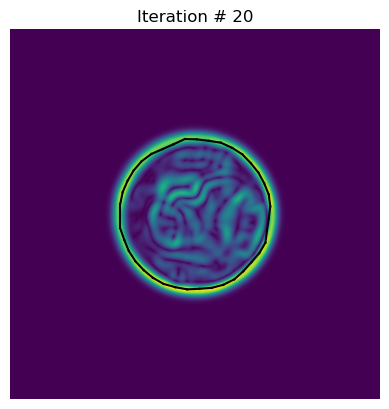

1590.0020601714539


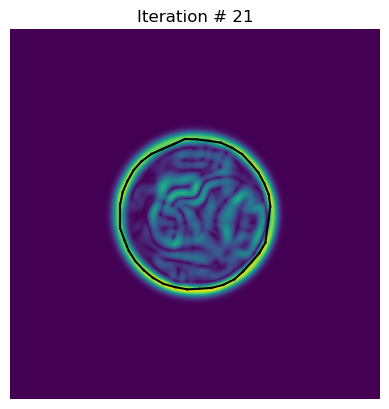

1588.910034526322


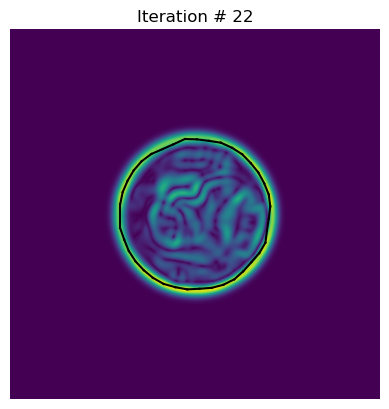

1590.0020601714539


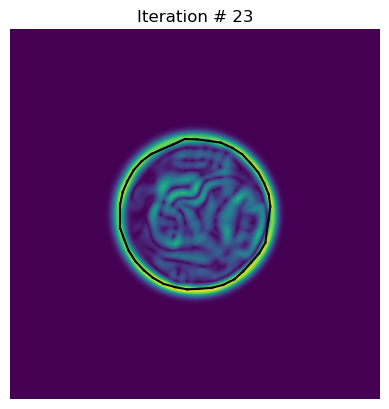

1588.910034526322


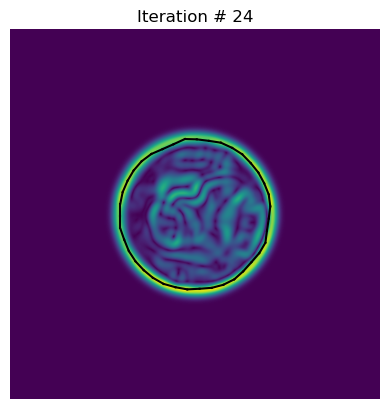

1590.0020601714539


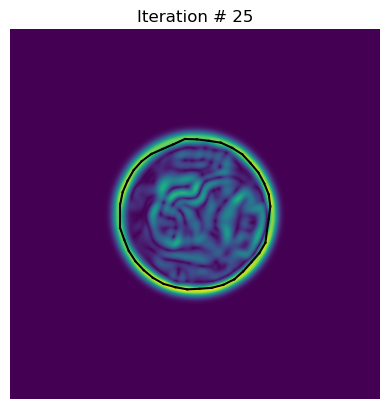

1588.910034526322


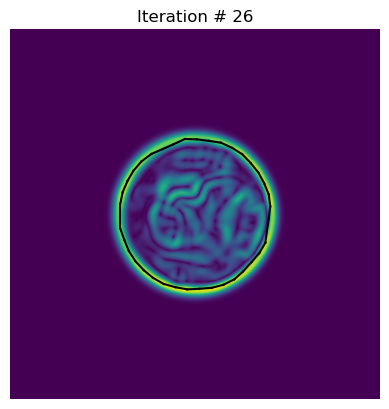

1590.0020601714539


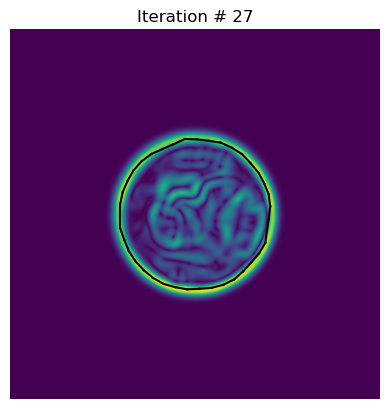

1588.910034526322


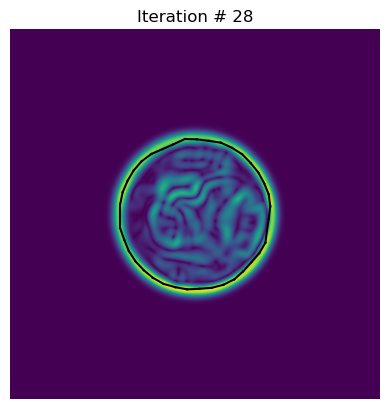

1590.0020601714539


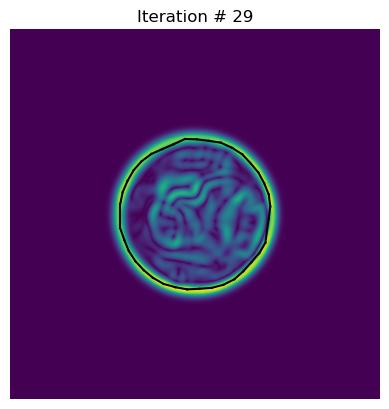

1588.910034526322


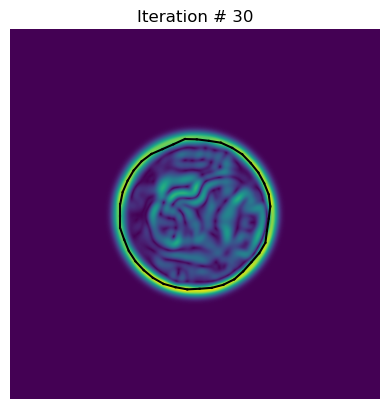

1590.0020601714539


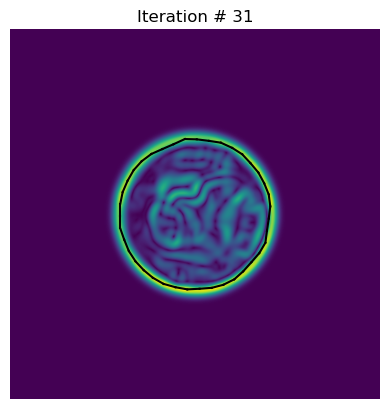

1588.910034526322


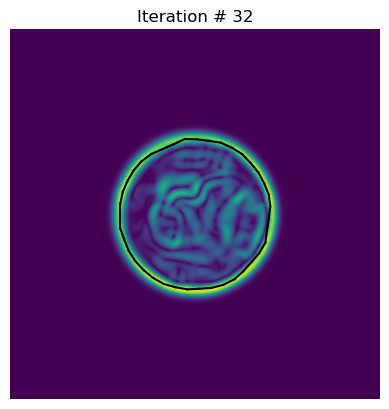

1590.0020601714539


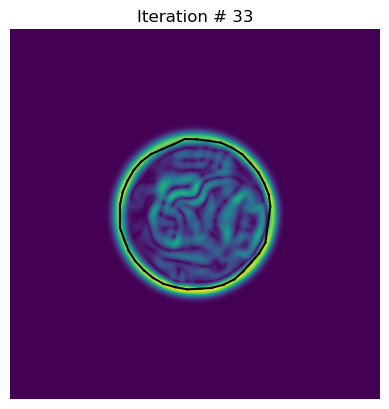

1588.910034526322


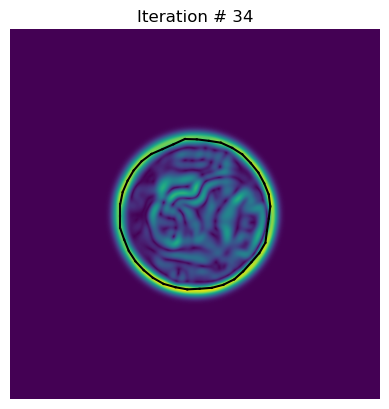

1590.0020601714539


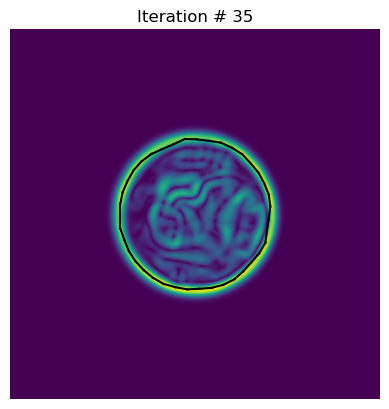

1588.910034526322


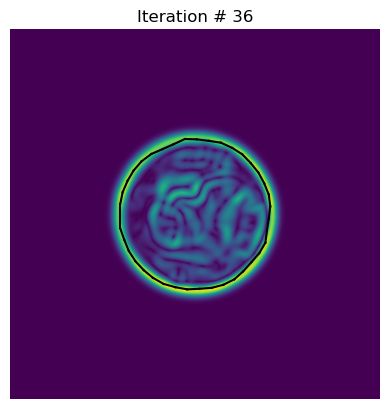

1590.0020601714539


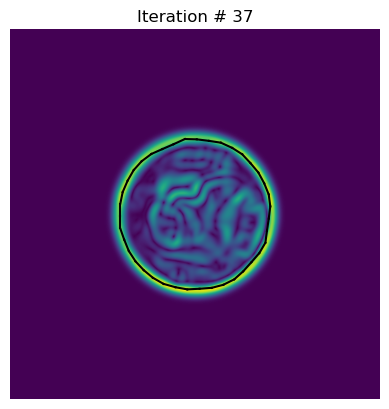

1588.910034526322


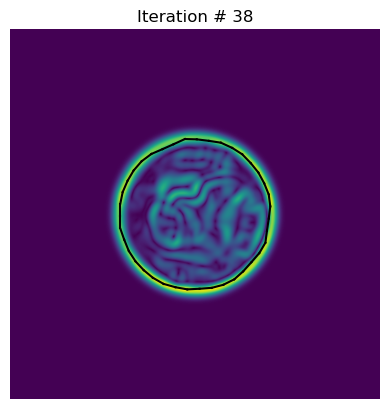

1590.0020601714539


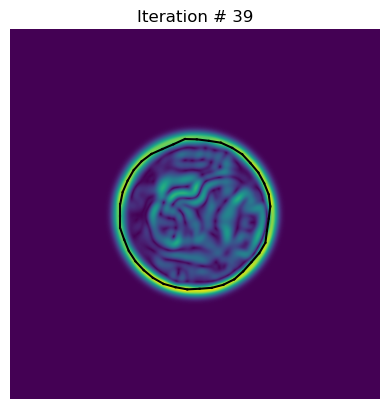

1588.910034526322


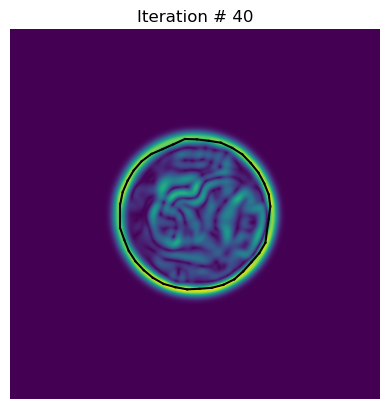

1590.0020601714539


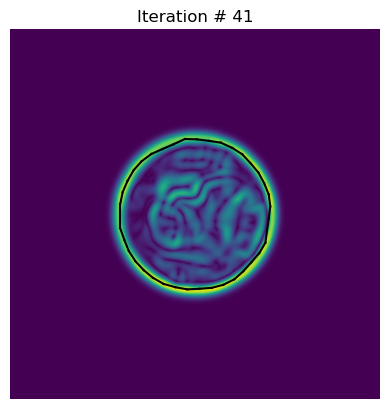

1588.910034526322


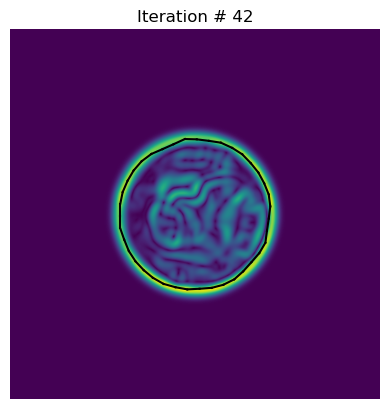

1590.0020601714539


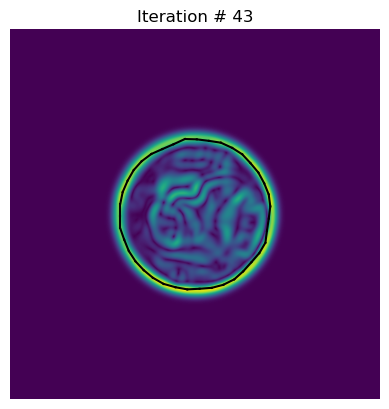

1588.910034526322


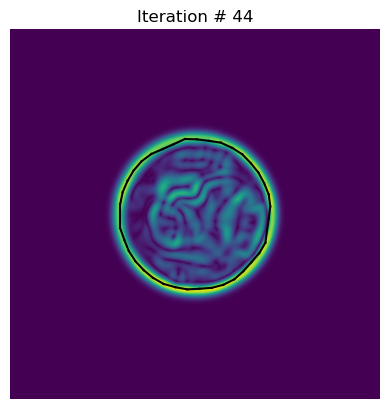

1590.0020601714539


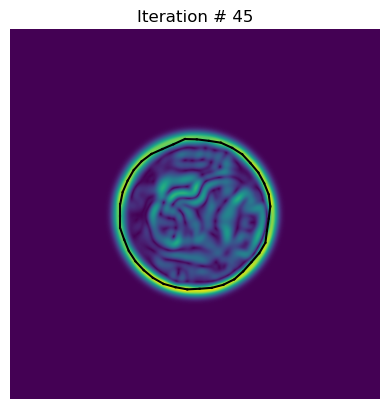

1588.910034526322


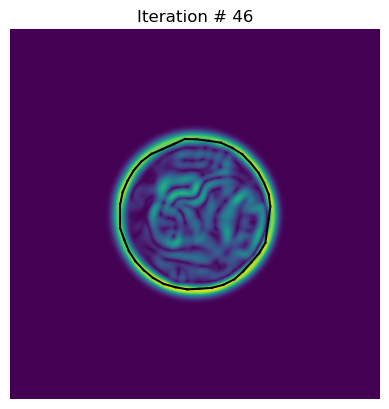

1590.0020601714539


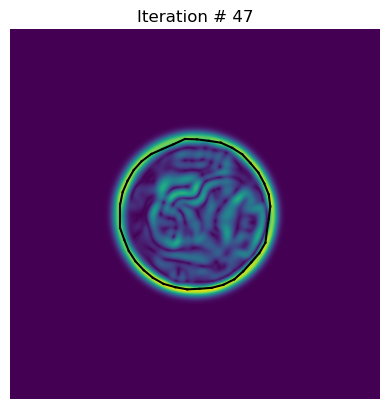

1588.910034526322


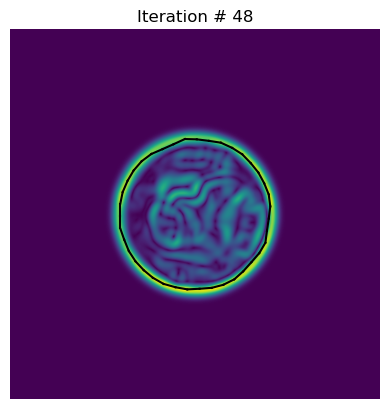

1590.0020601714539


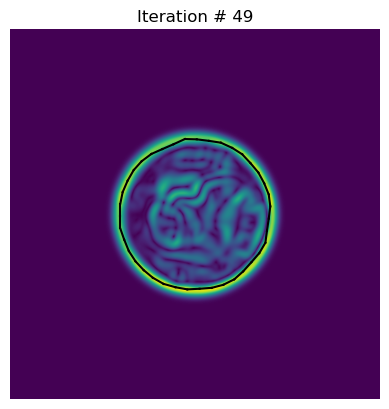

1588.910034526322


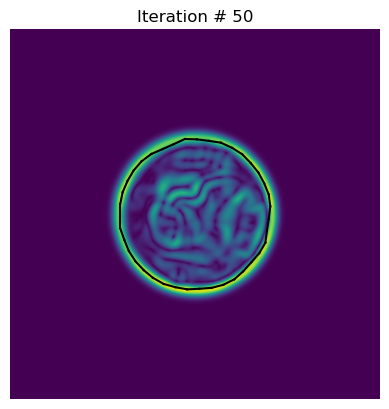

1590.0020601714539


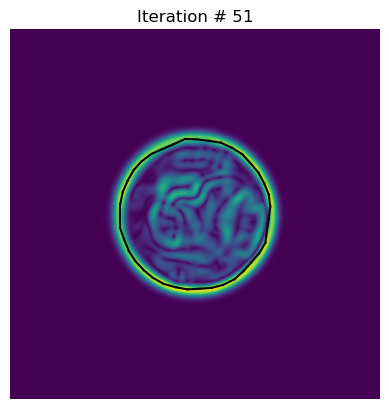

1588.910034526322


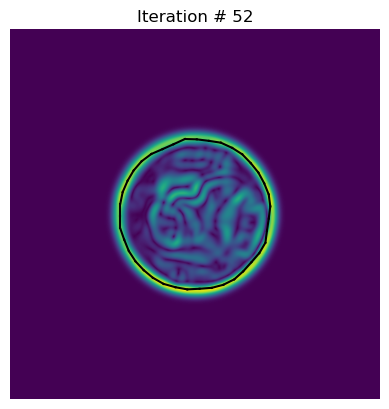

1590.0020601714539


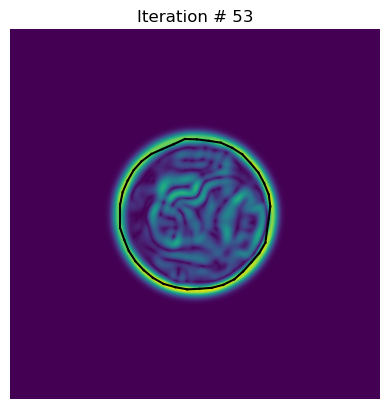

1588.910034526322


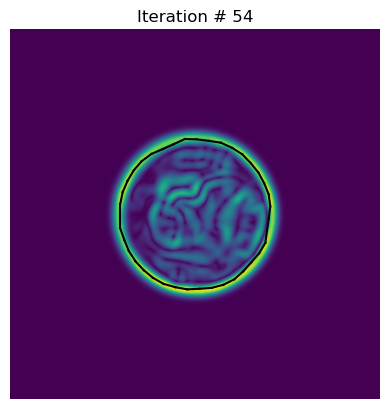

1590.0020601714539


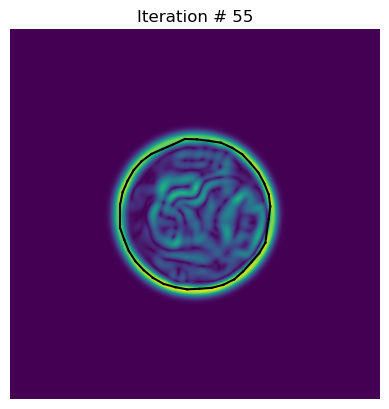

1588.910034526322


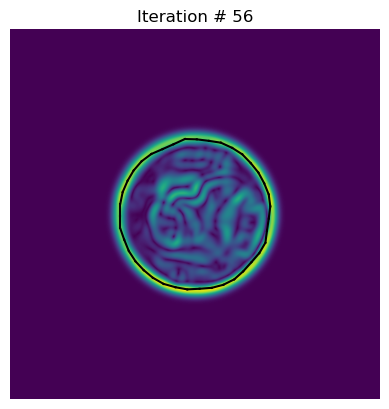

1590.0020601714539


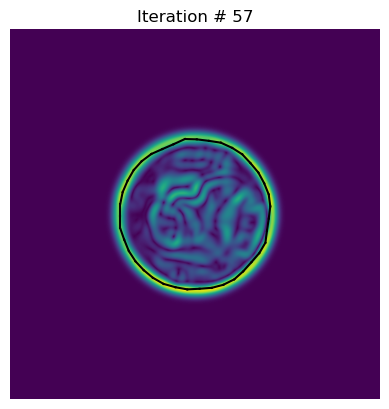

1588.910034526322


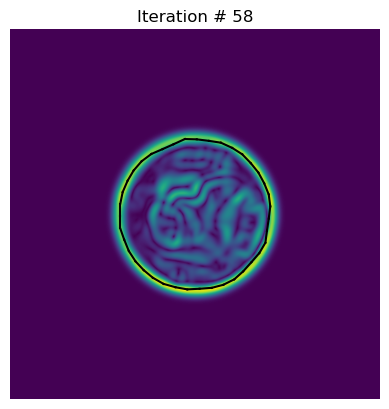

1590.0020601714539


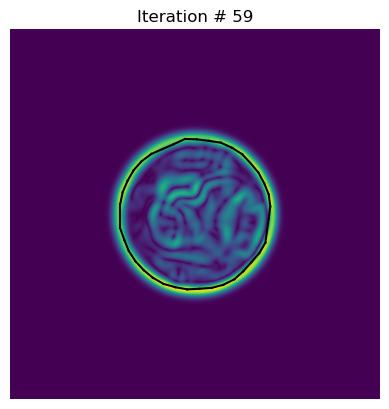

1588.910034526322


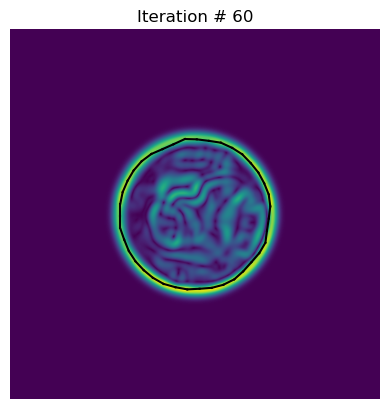

1590.0020601714539


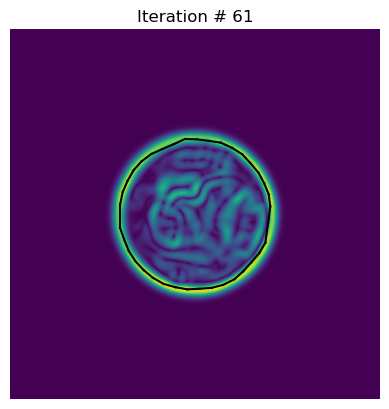

1588.910034526322


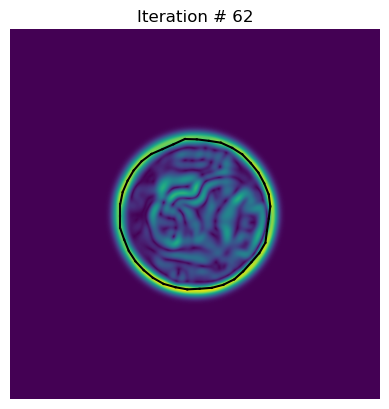

1590.0020601714539


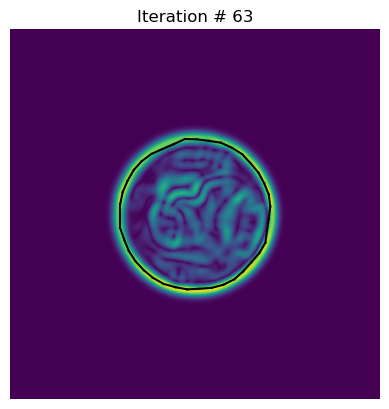

1588.910034526322


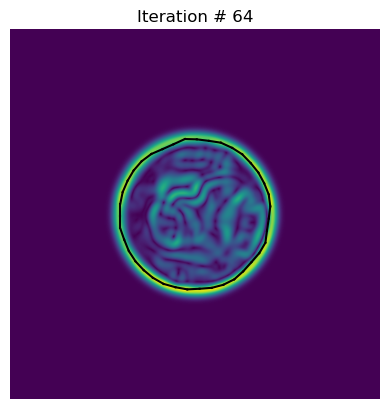

1590.0020601714539


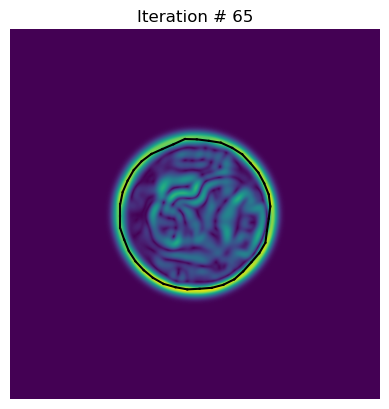

1588.910034526322


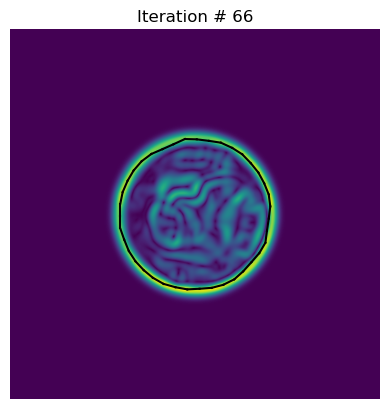

1590.0020601714539


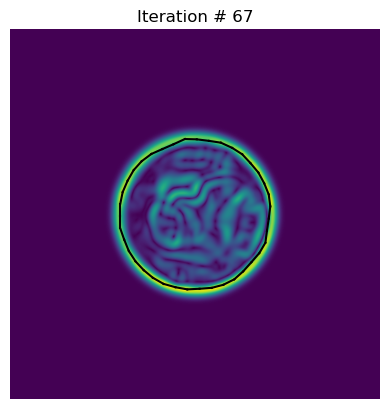

1588.910034526322


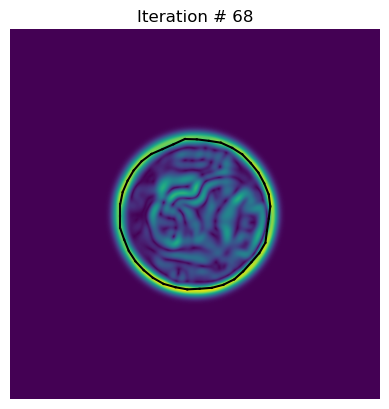

1590.0020601714539


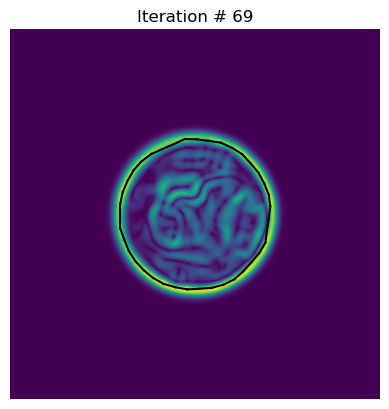

1588.910034526322


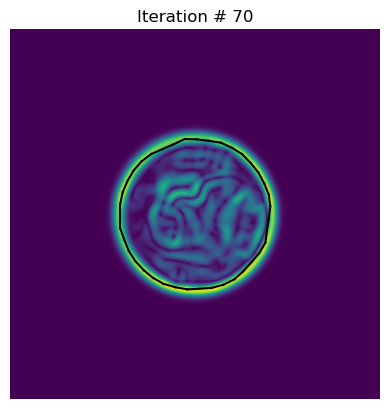

1590.0020601714539


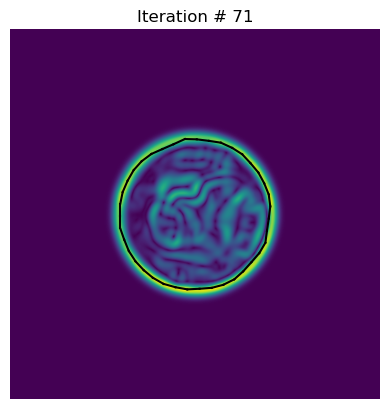

1588.910034526322


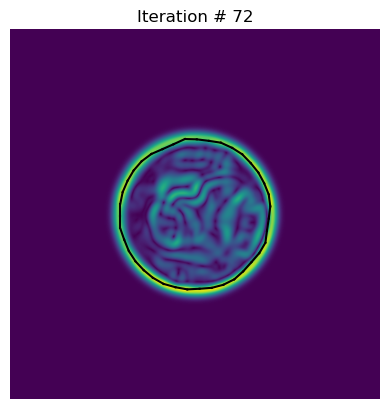

1590.0020601714539


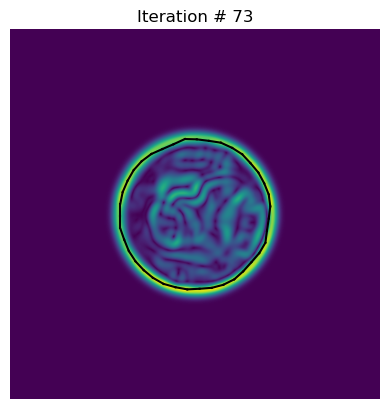

1588.910034526322


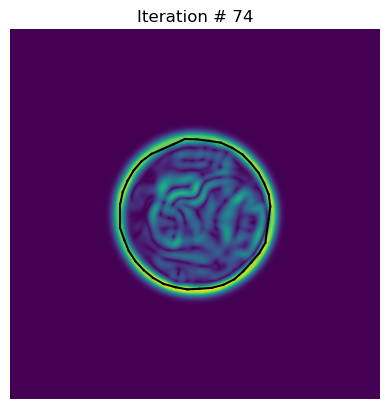

1590.0020601714539


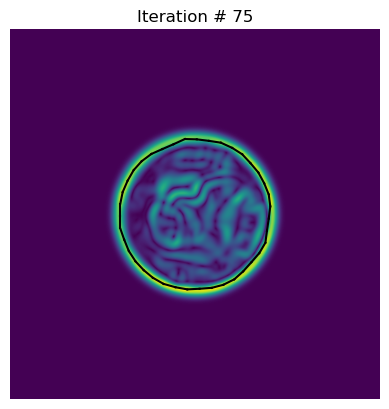

1588.910034526322


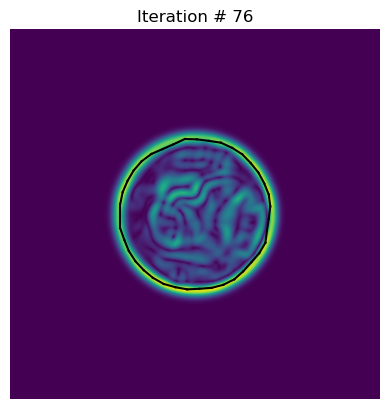

1590.0020601714539


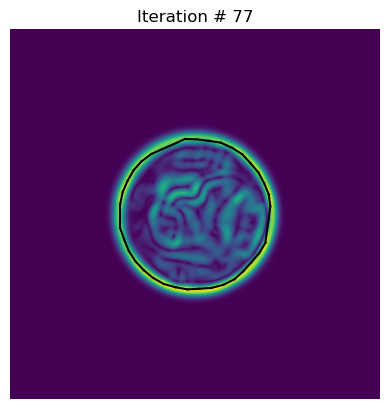

1588.910034526322


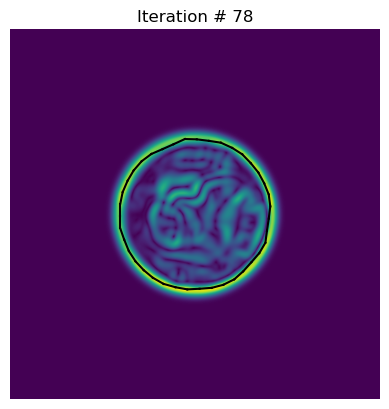

1590.0020601714539


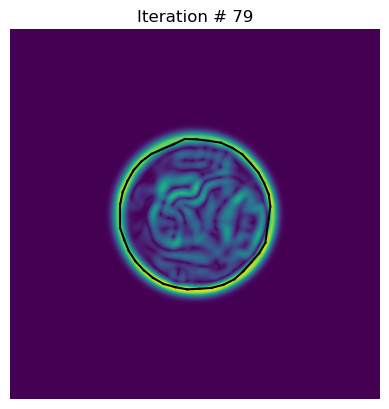

1588.910034526322


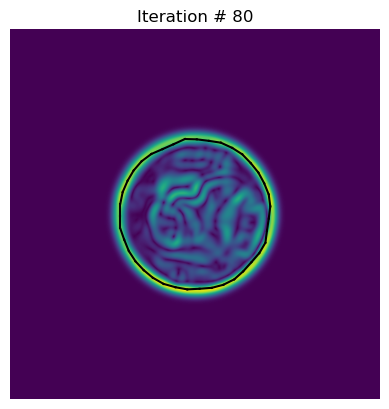

1590.0020601714539


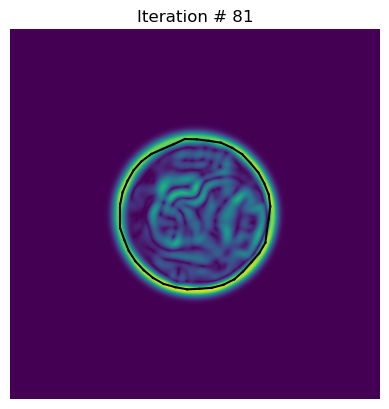

1588.910034526322


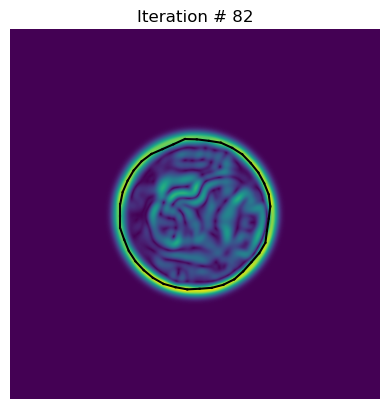

1590.0020601714539


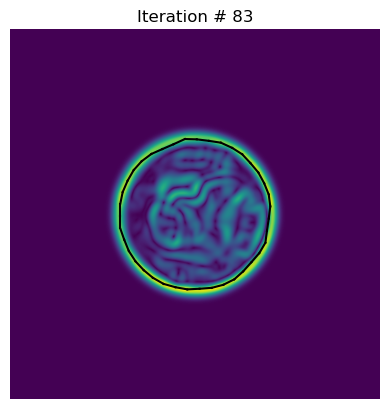

1588.910034526322


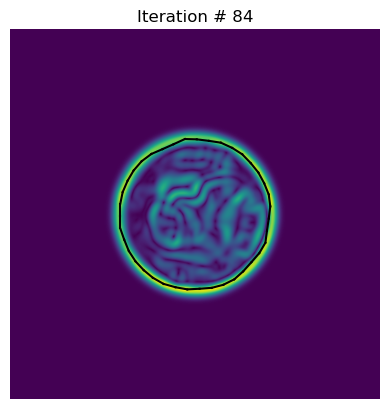

1590.0020601714539


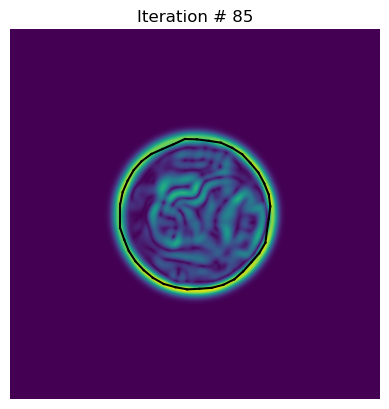

1588.910034526322


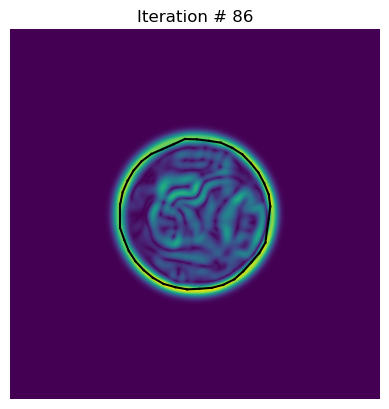

1590.0020601714539


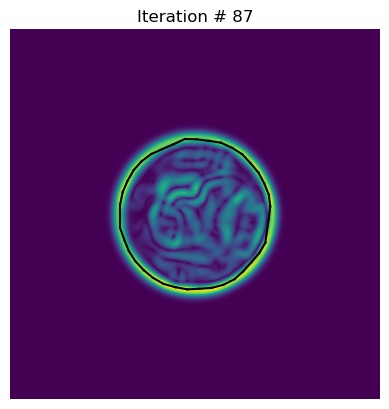

1588.910034526322


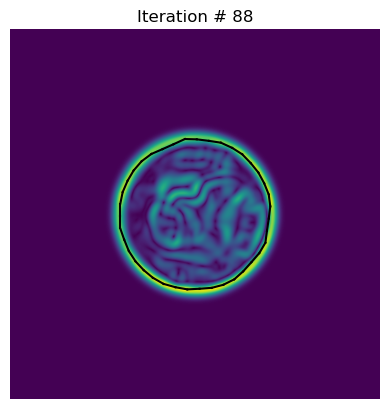

1590.0020601714539


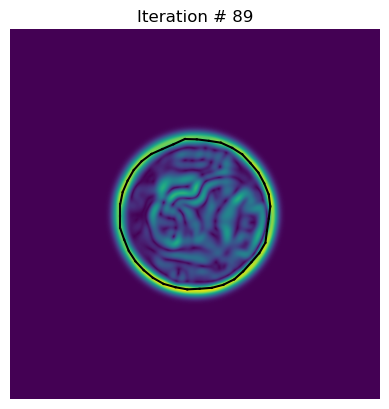

1588.910034526322


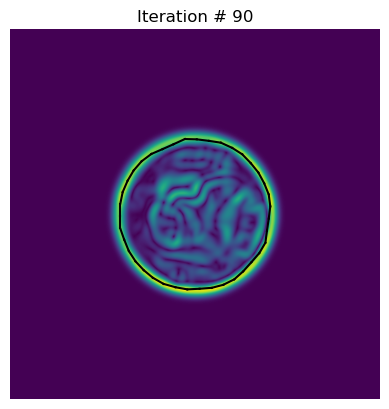

1590.0020601714539


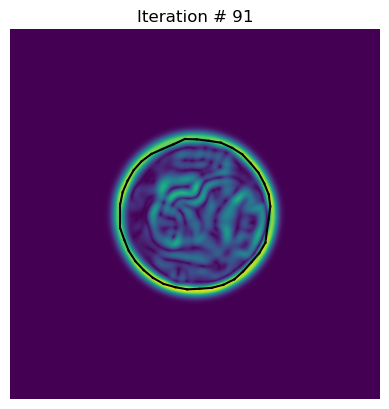

1588.910034526322


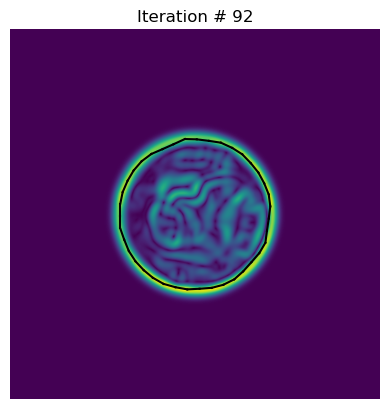

1590.0020601714539


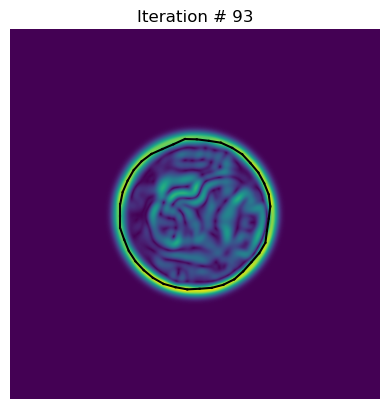

1588.910034526322


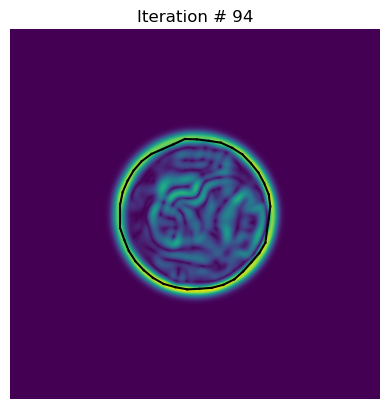

1590.0020601714539


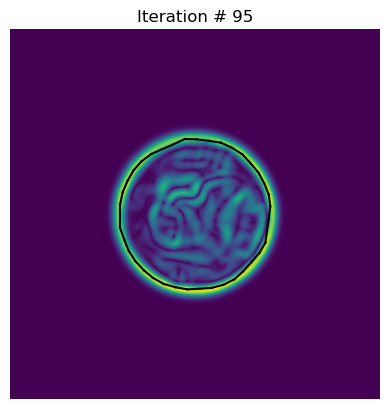

1588.910034526322


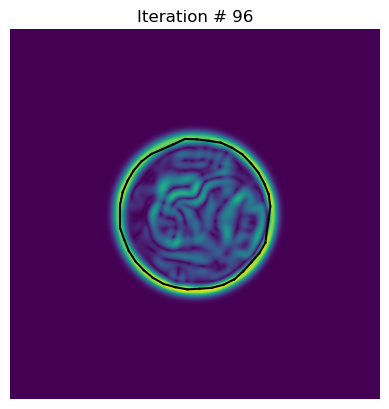

1590.0020601714539


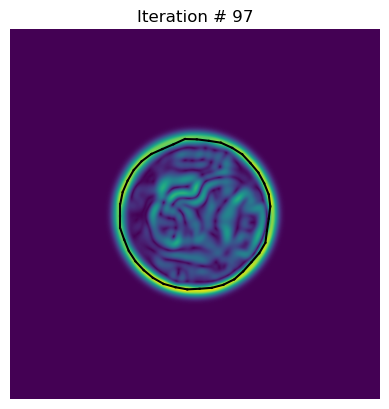

1588.910034526322


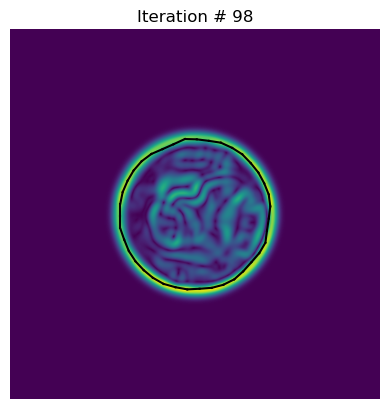

1590.0020601714539


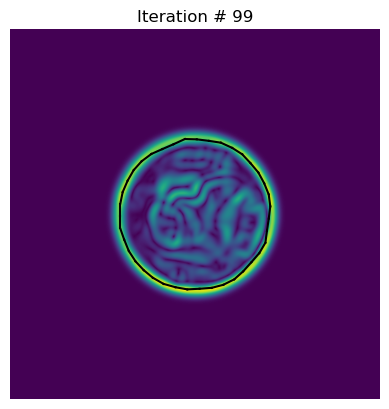

1588.910034526322


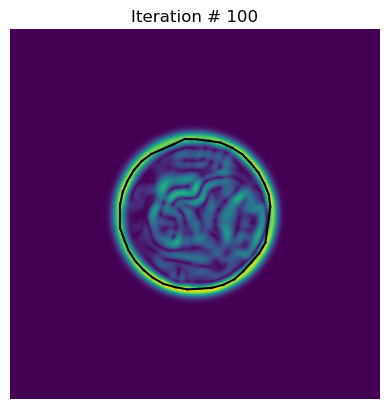

1590.0020601714539


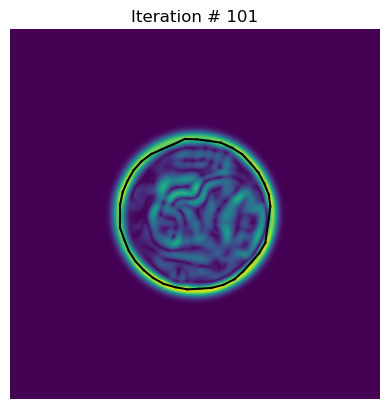

1588.910034526322


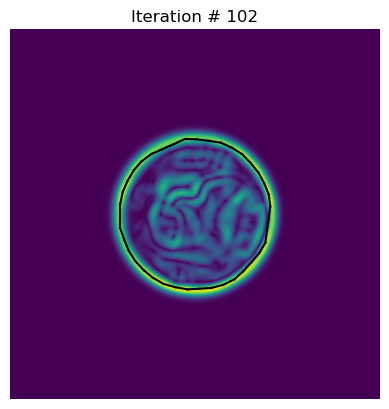

1590.0020601714539


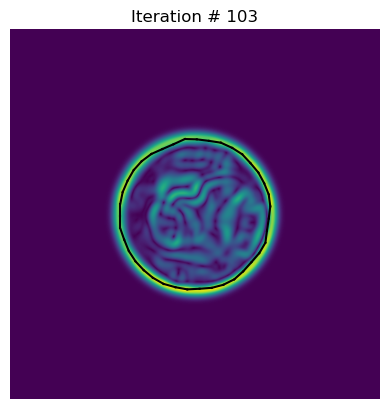

1588.910034526322


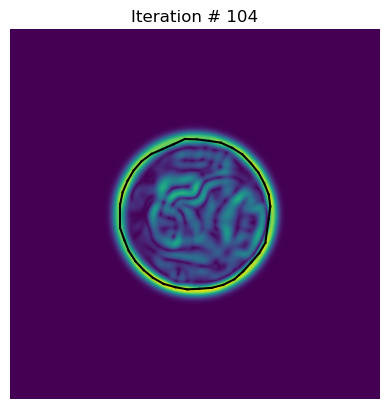

1590.0020601714539


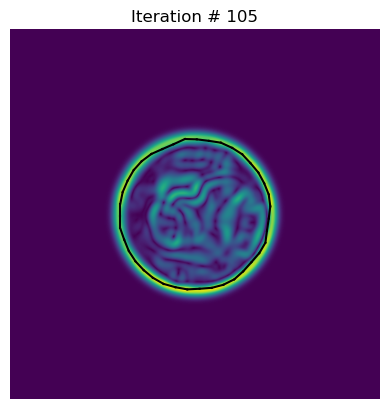

1588.910034526322


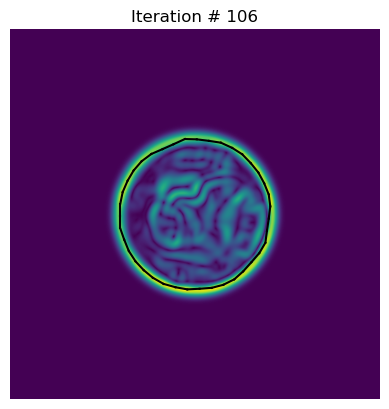

1590.0020601714539


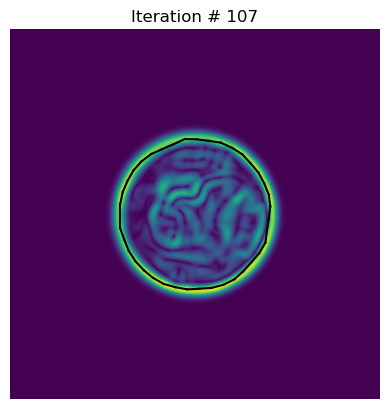

1588.910034526322


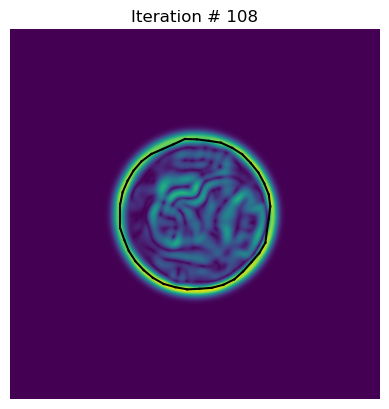

1590.0020601714539


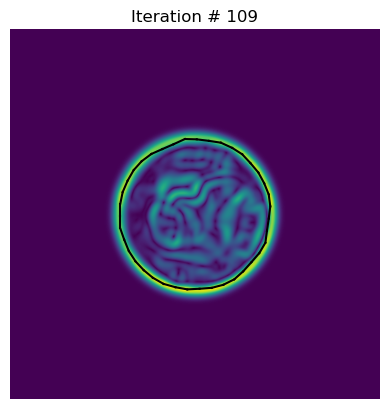

1588.910034526322


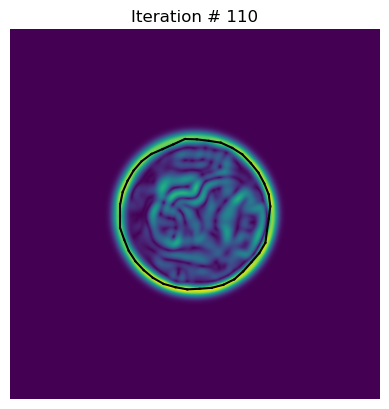

1590.0020601714539


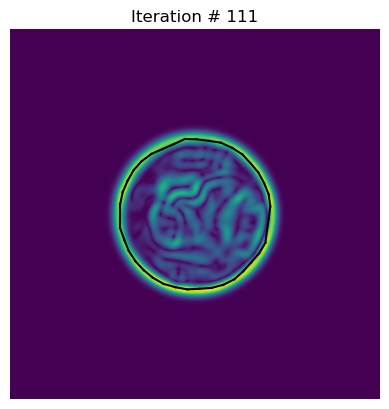

1588.910034526322


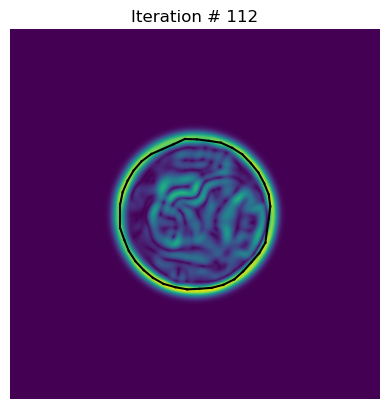

1590.0020601714539


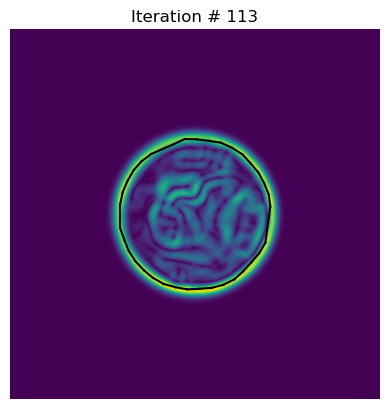

1588.910034526322


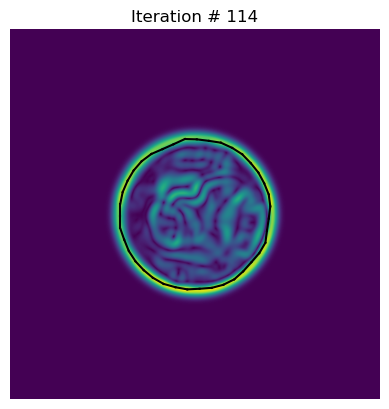

1590.0020601714539


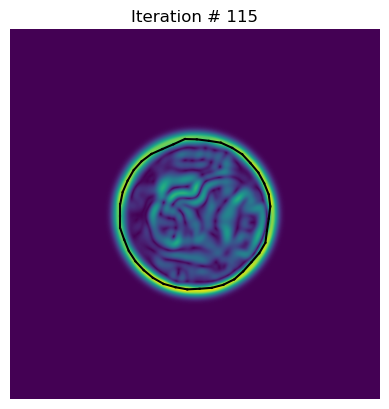

1588.910034526322


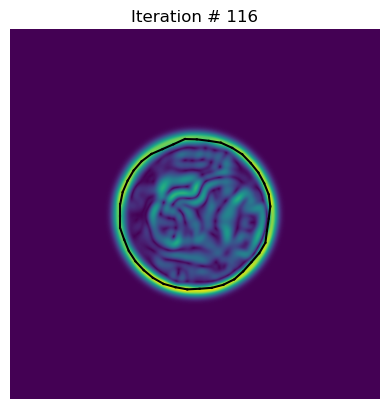

1590.0020601714539


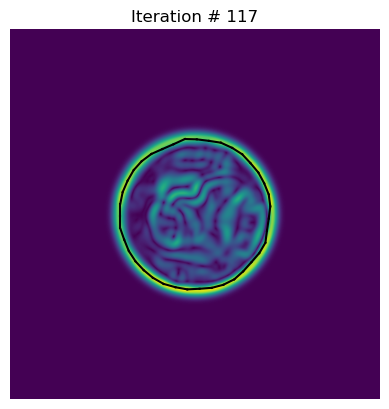

1588.910034526322


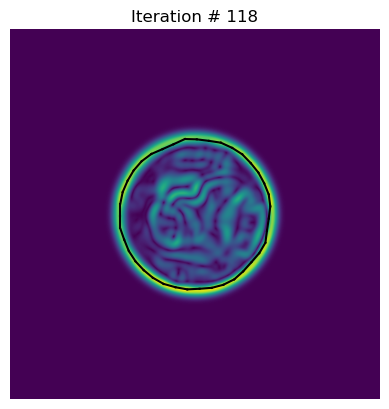

1590.0020601714539


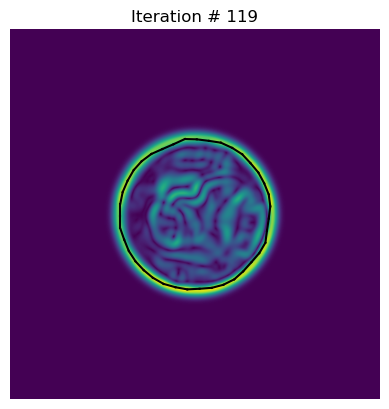

1588.910034526322


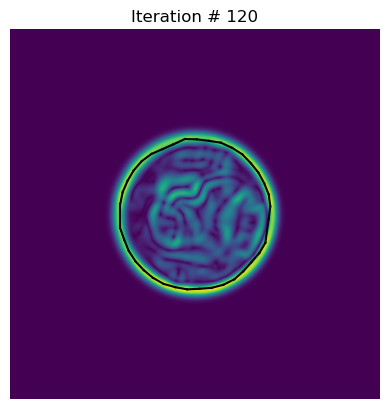

1590.0020601714539


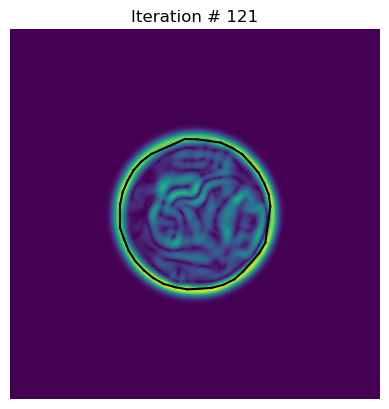

1588.910034526322


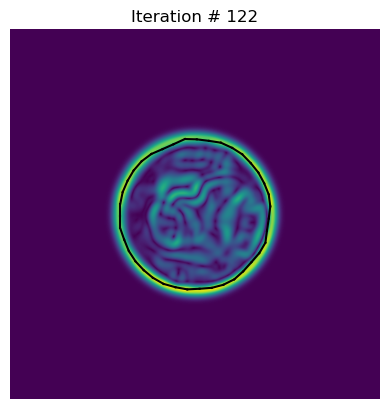

1590.0020601714539


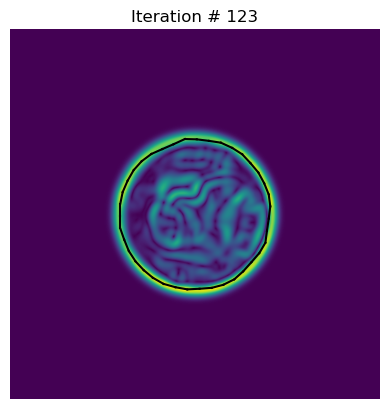

1588.910034526322


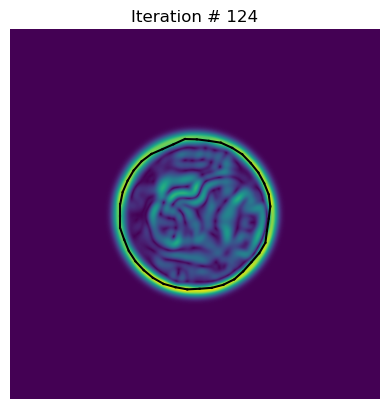

1590.0020601714539


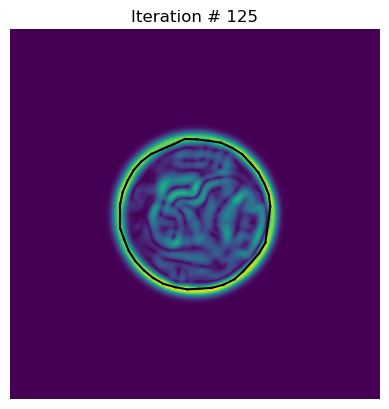

1588.910034526322


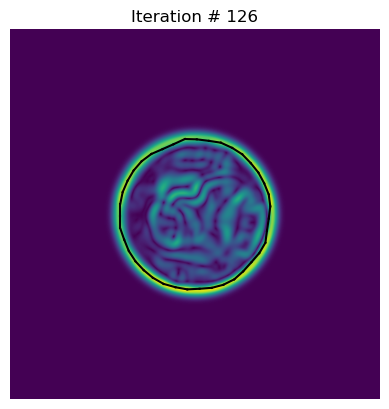

1590.0020601714539


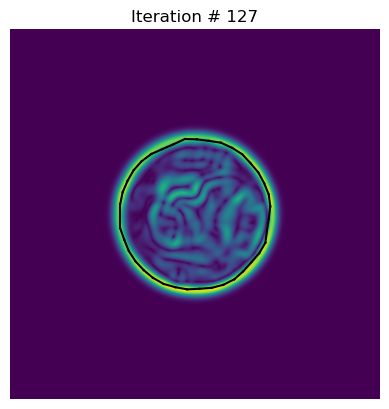

1588.910034526322


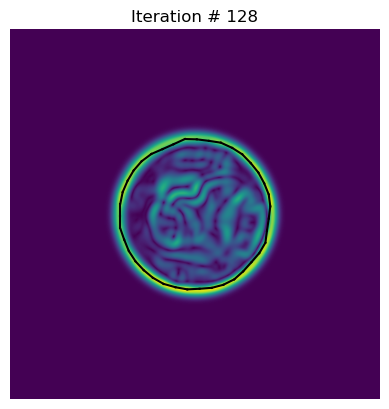

1590.0020601714539


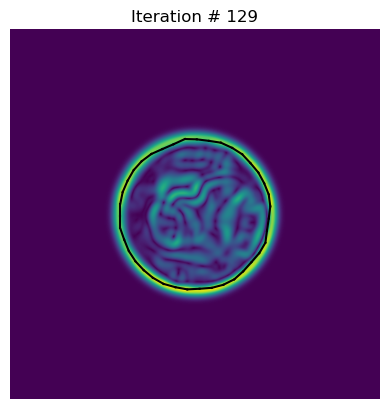

1588.910034526322


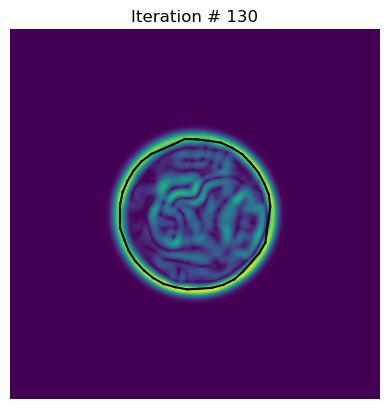

1590.0020601714539


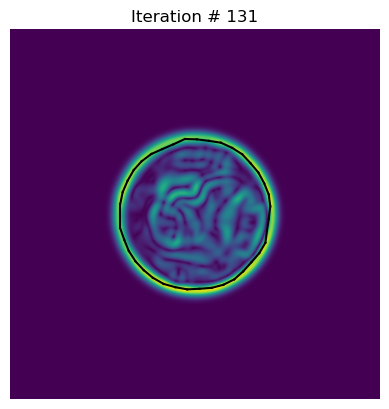

1588.910034526322


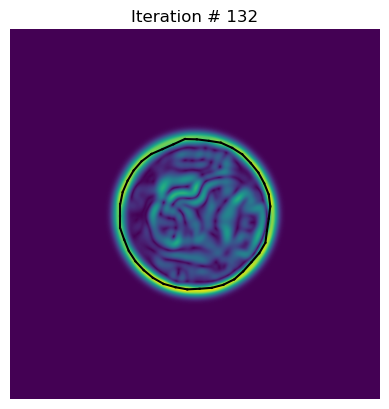

1590.0020601714539


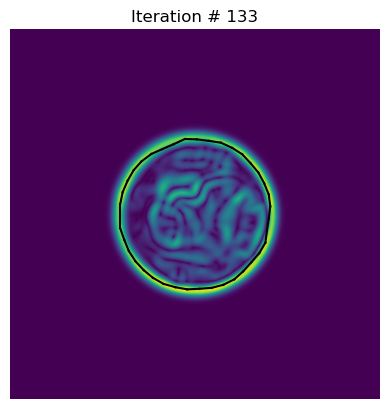

1588.910034526322


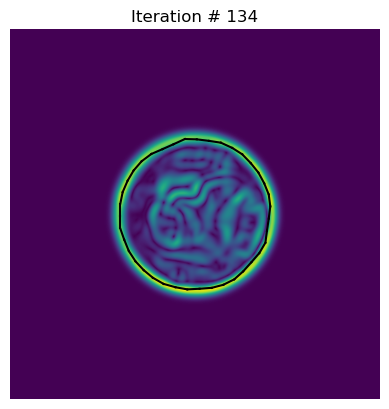

1590.0020601714539


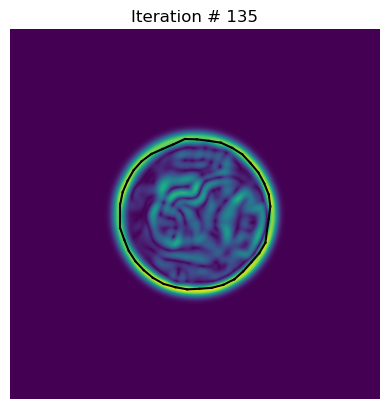

1588.910034526322


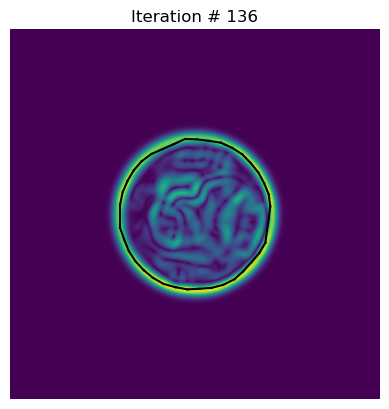

1590.0020601714539


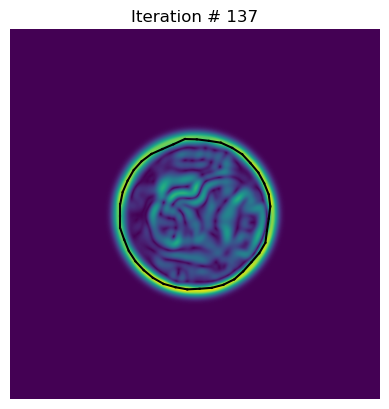

1588.910034526322


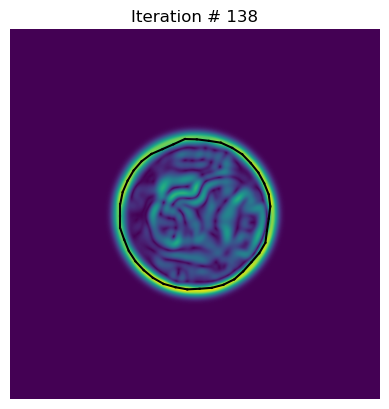

1590.0020601714539


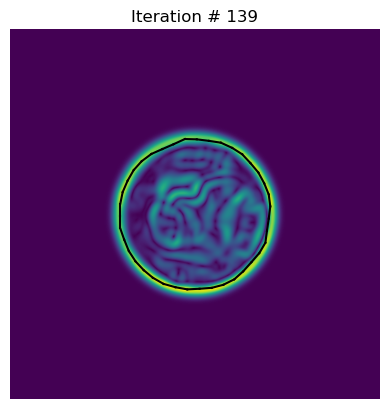

1588.910034526322


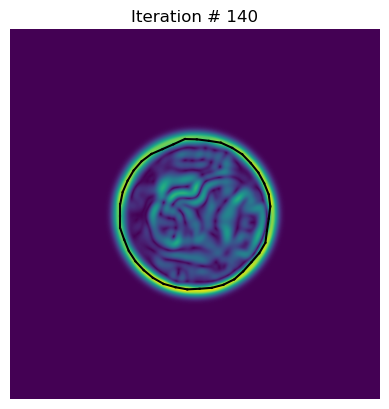

1590.0020601714539


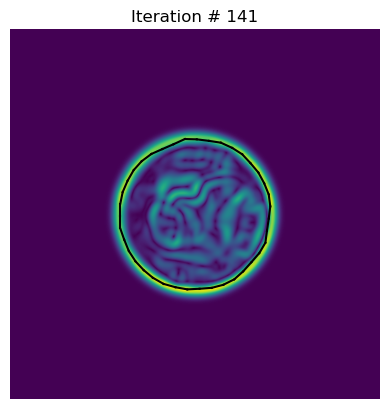

1588.910034526322


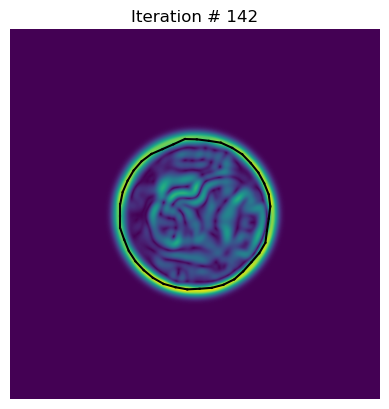

1590.0020601714539


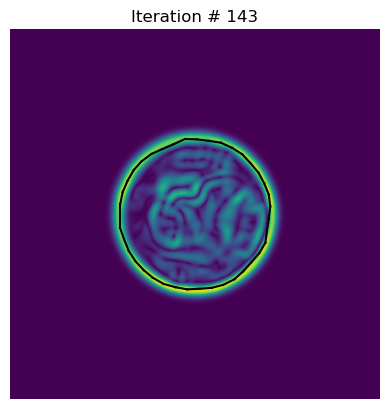

1588.910034526322


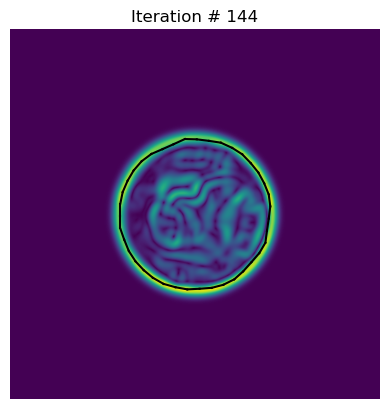

1590.0020601714539


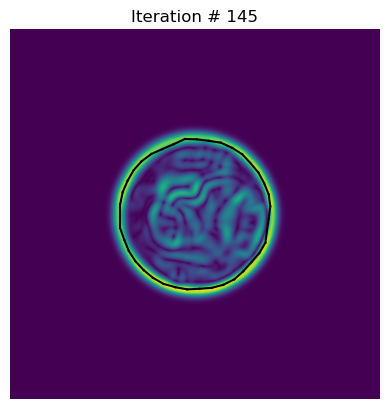

1588.910034526322


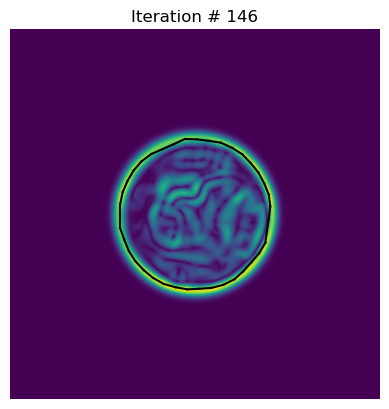

1590.0020601714539


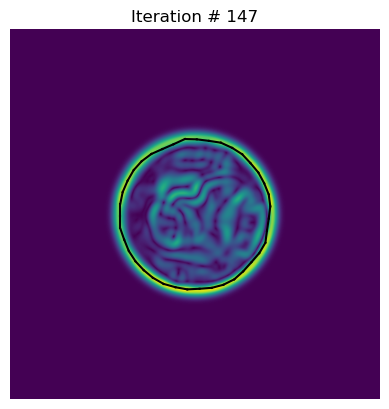

1588.910034526322


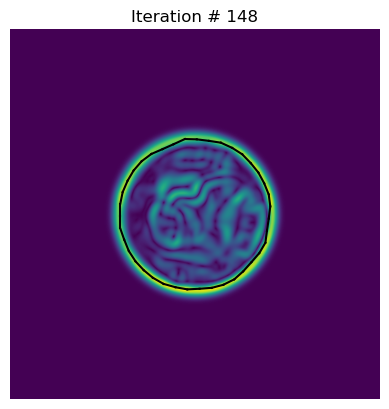

1590.0020601714539


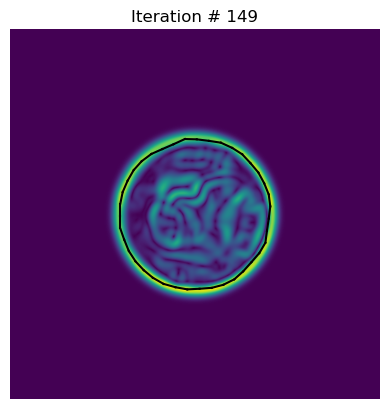

1588.910034526322


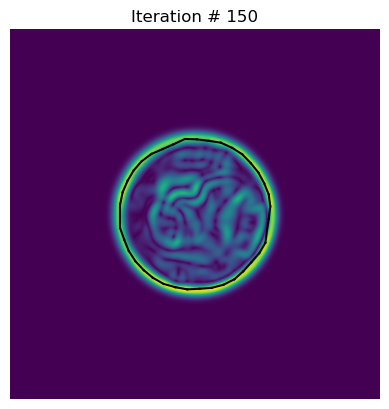

1590.0020601714539


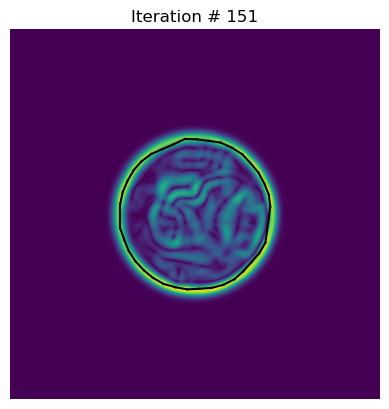

1588.910034526322


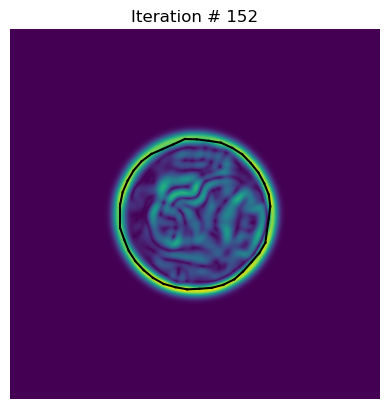

1590.0020601714539


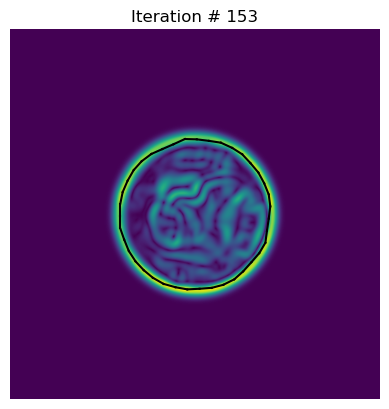

1588.910034526322


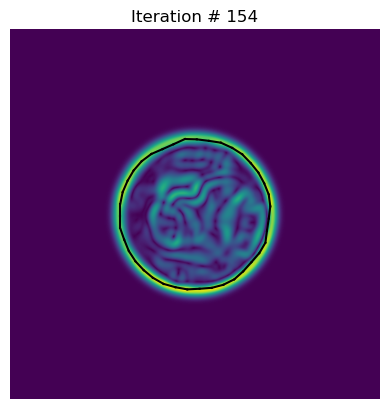

1590.0020601714539


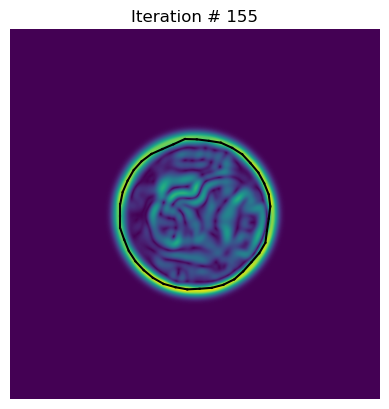

1588.910034526322


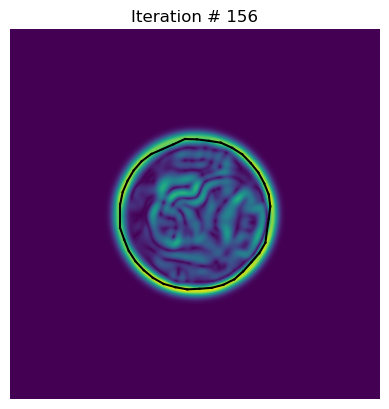

1590.0020601714539


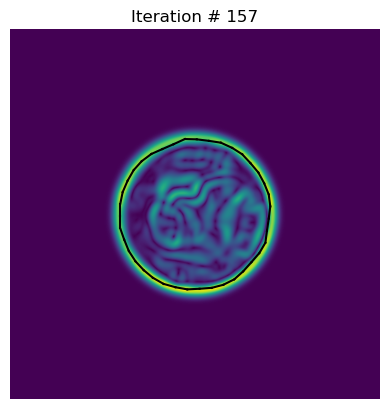

1588.910034526322


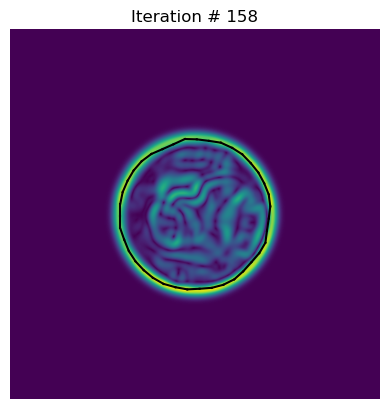

1590.0020601714539


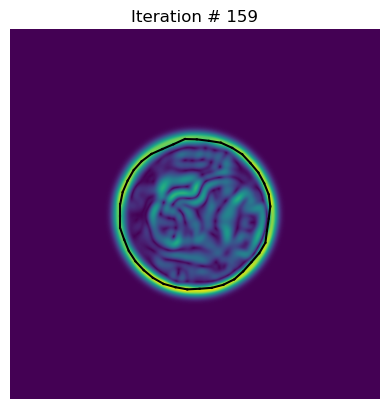

1588.910034526322


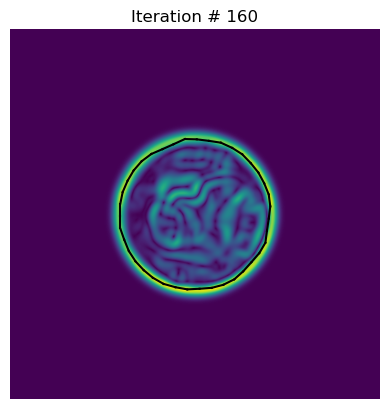

1590.0020601714539


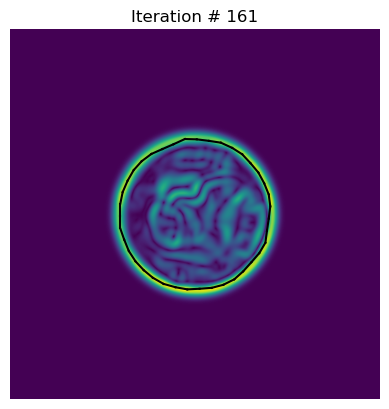

1588.910034526322


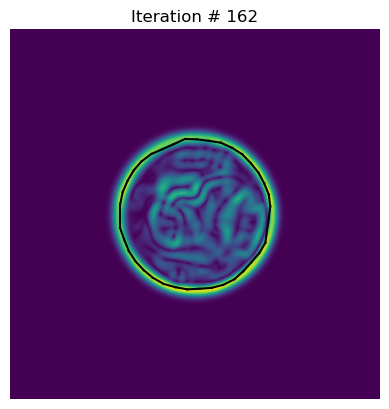

1590.0020601714539


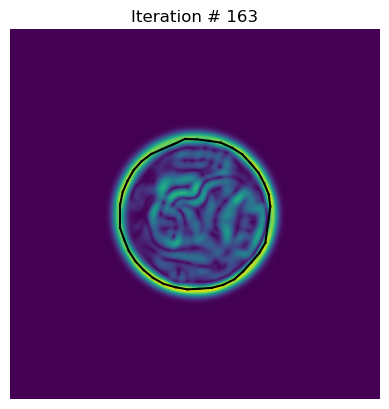

1588.910034526322


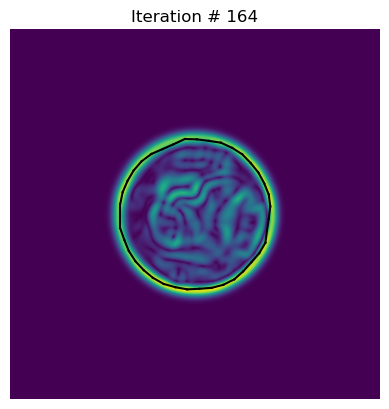

1590.0020601714539


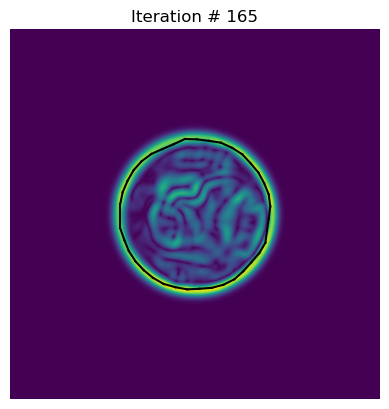

1588.910034526322


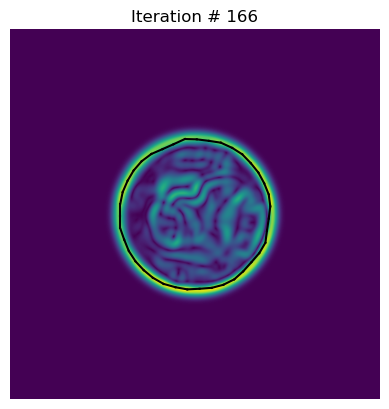

1590.0020601714539


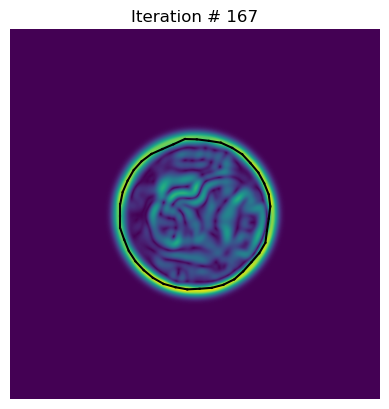

1588.910034526322


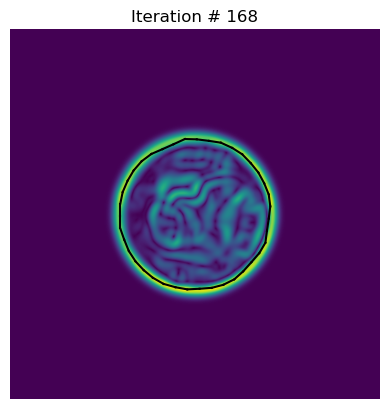

1590.0020601714539


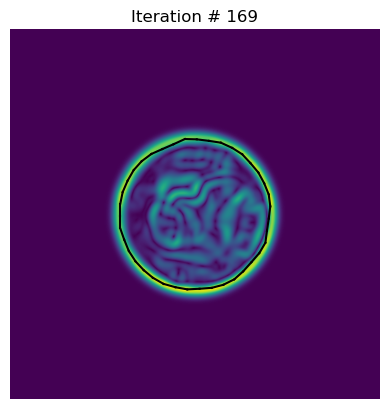

1588.910034526322


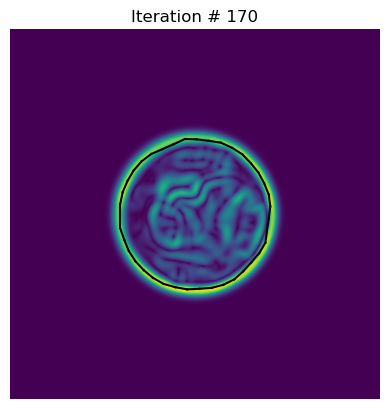

1590.0020601714539


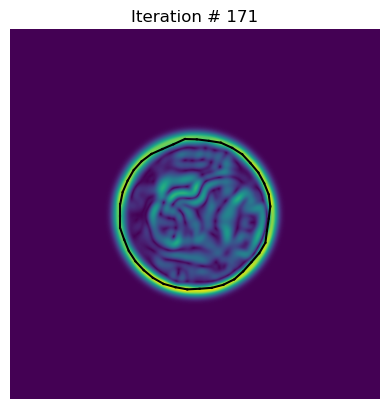

1588.910034526322


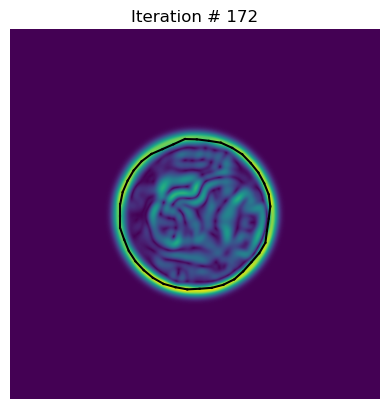

1590.0020601714539


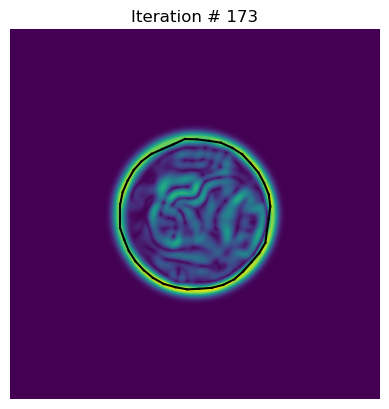

1588.910034526322


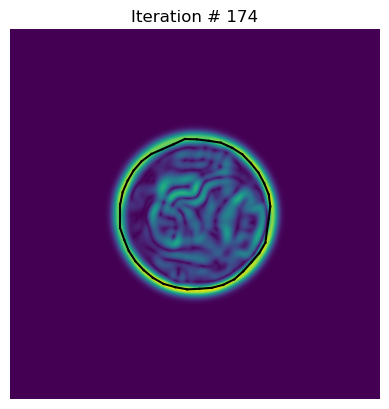

1590.0020601714539


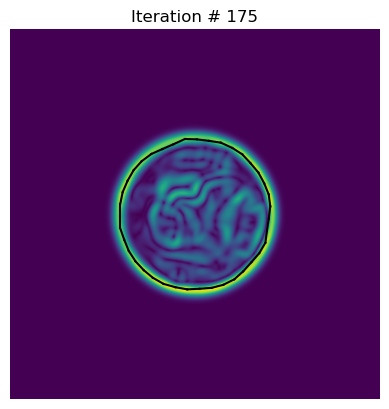

1588.910034526322


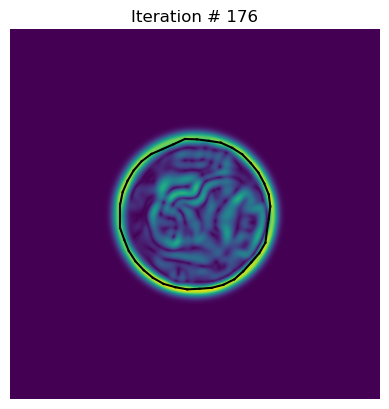

1590.0020601714539


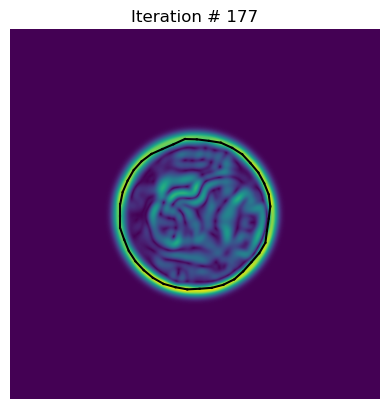

1588.910034526322


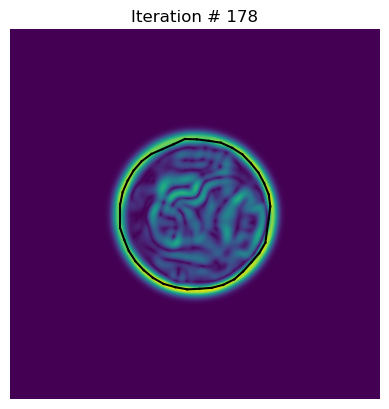

1590.0020601714539


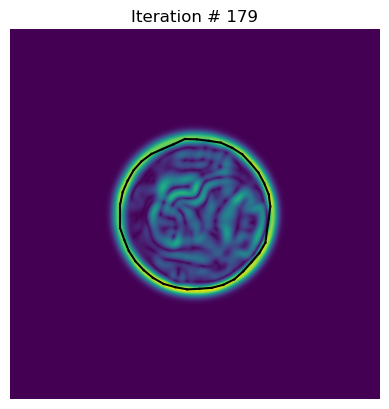

1588.910034526322


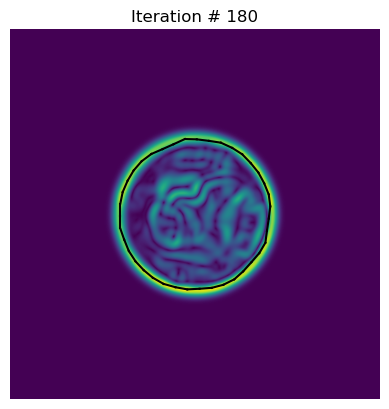

1590.0020601714539


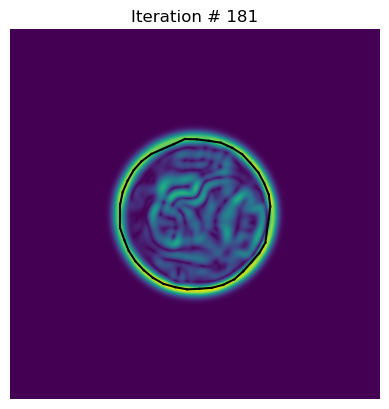

1588.910034526322


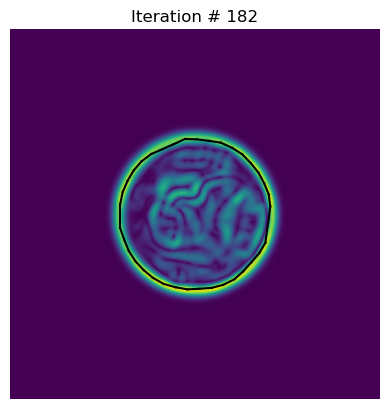

1590.0020601714539


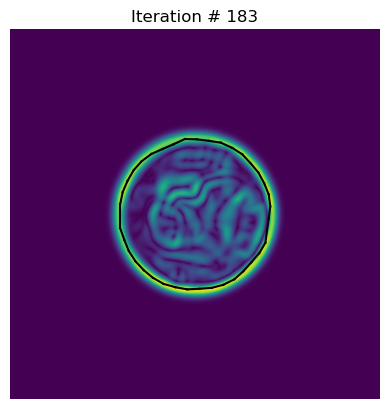

1588.910034526322


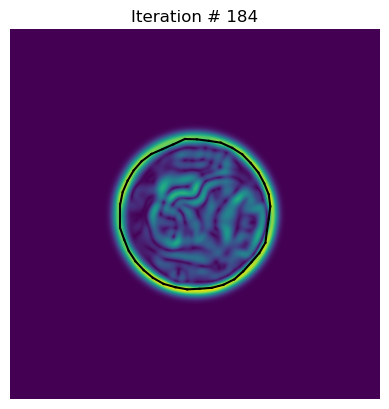

1590.0020601714539


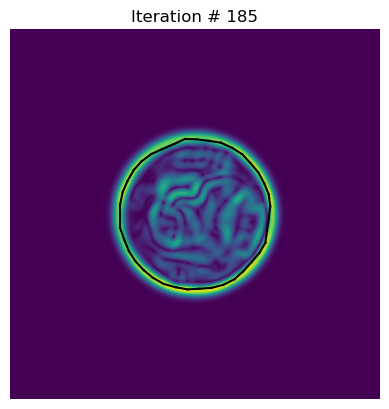

1588.910034526322


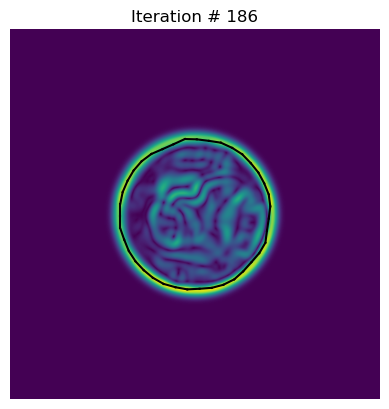

1590.0020601714539


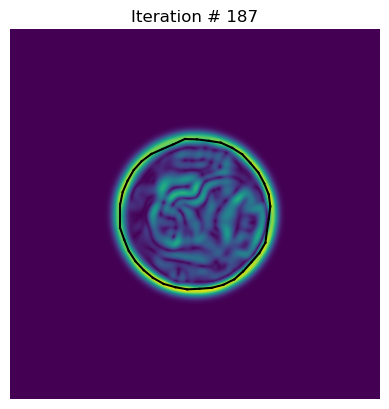

1588.910034526322


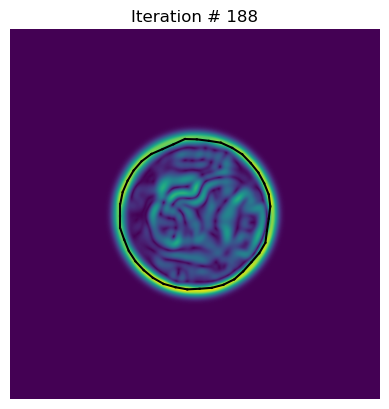

1590.0020601714539


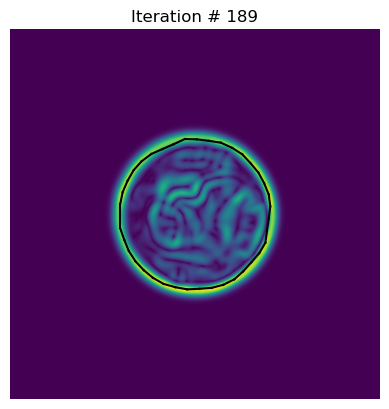

1588.910034526322


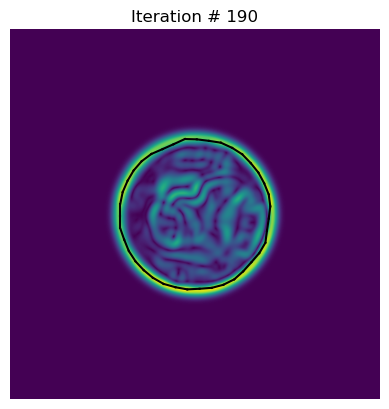

1590.0020601714539


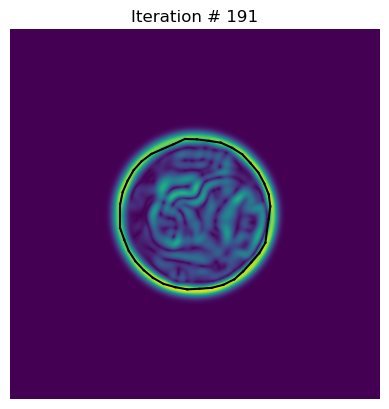

1588.910034526322


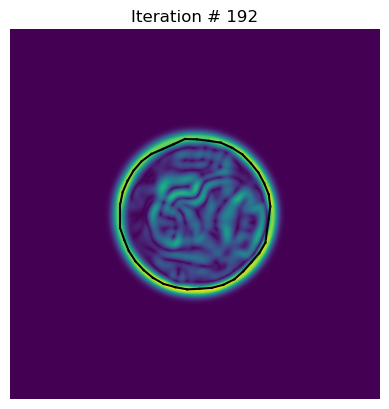

1590.0020601714539


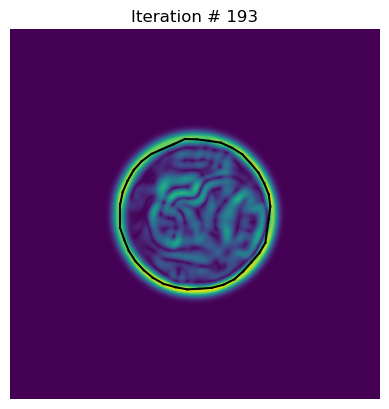

1588.910034526322


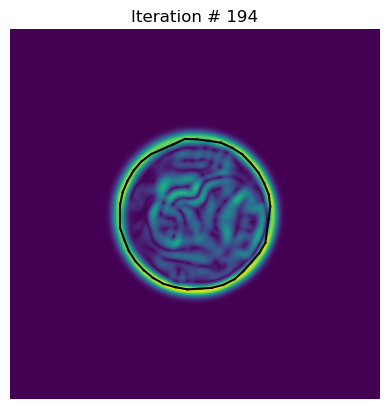

1590.0020601714539


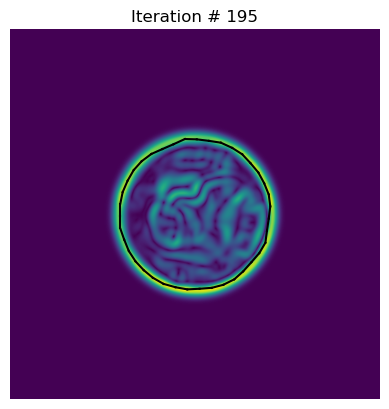

1588.910034526322


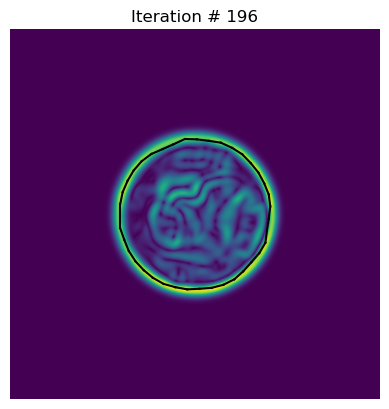

1590.0020601714539


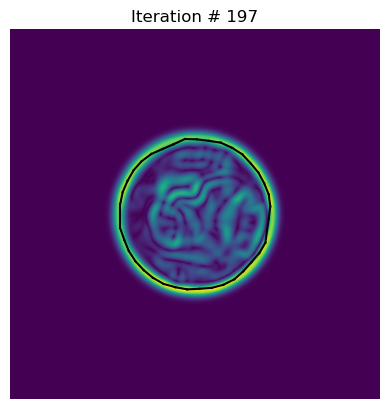

1588.910034526322


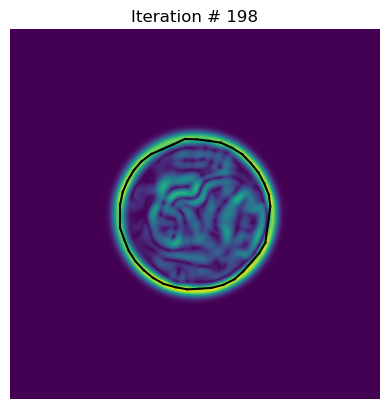

1590.0020601714539


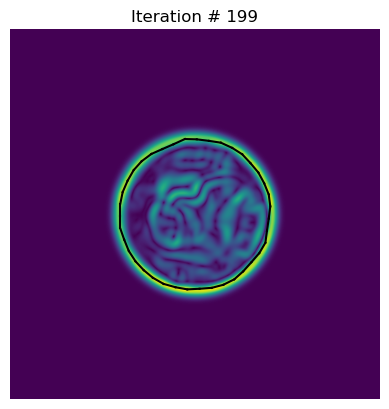

1588.910034526322


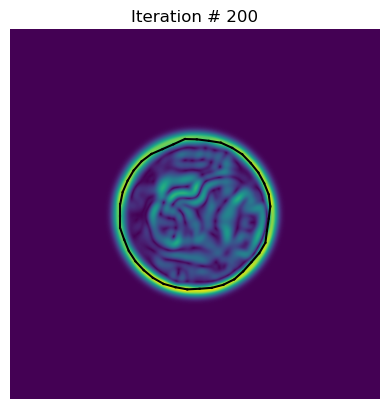

1590.0020601714539


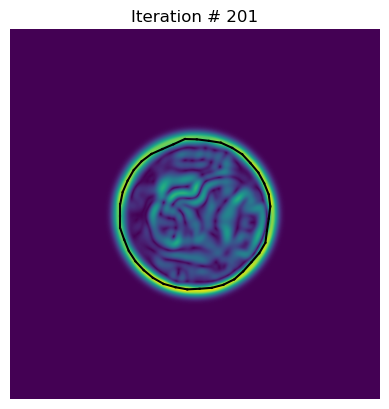

1588.910034526322


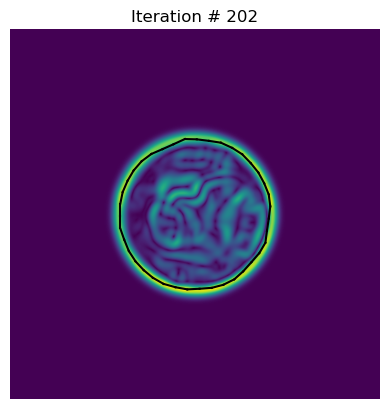

1590.0020601714539


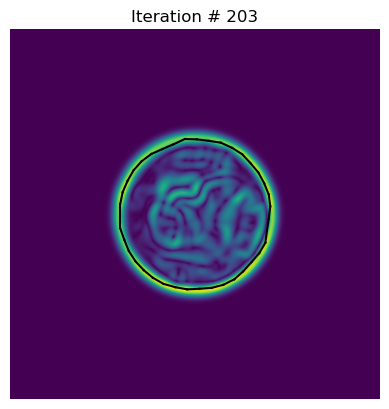

1588.910034526322


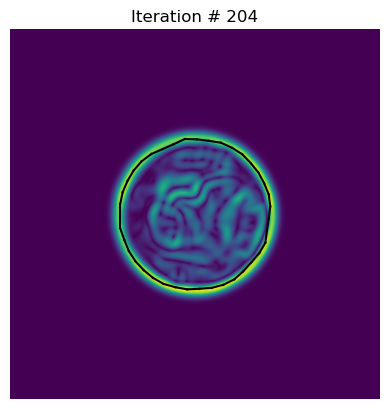

1590.0020601714539


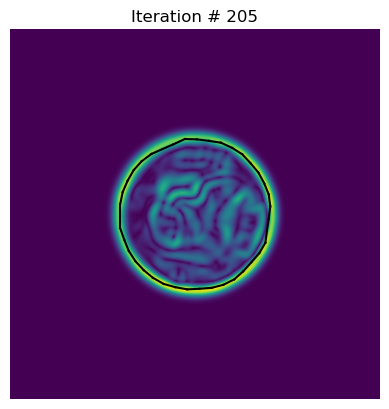

1588.910034526322


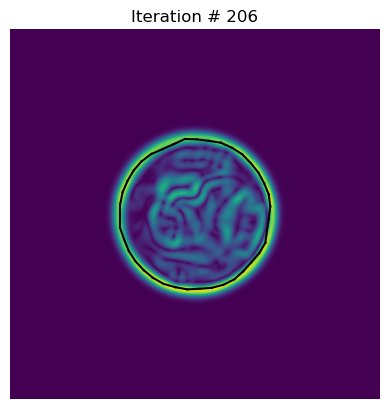

1590.0020601714539


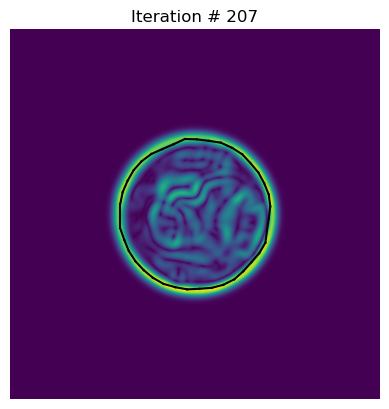

1588.910034526322


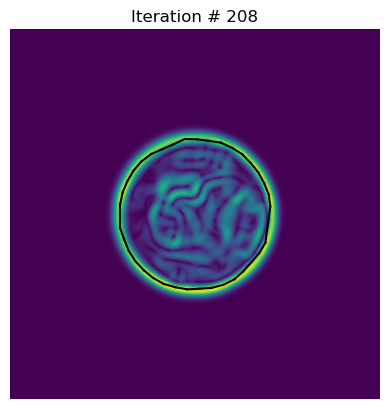

1590.0020601714539


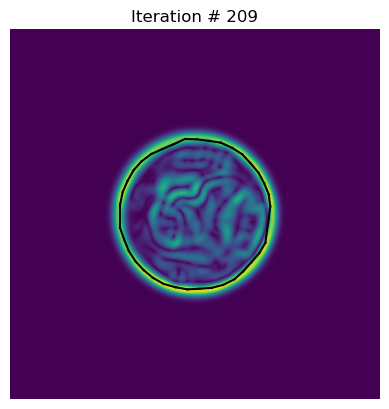

1588.910034526322


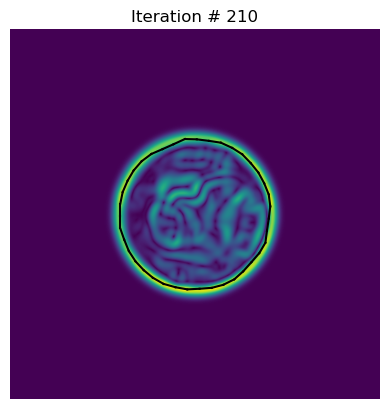

1590.0020601714539


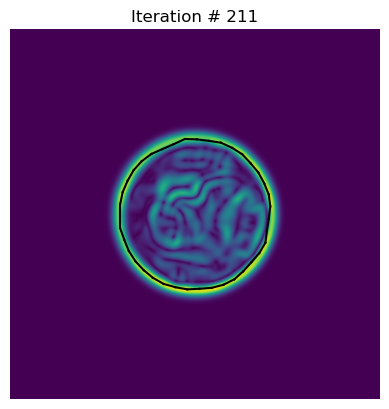

1588.910034526322


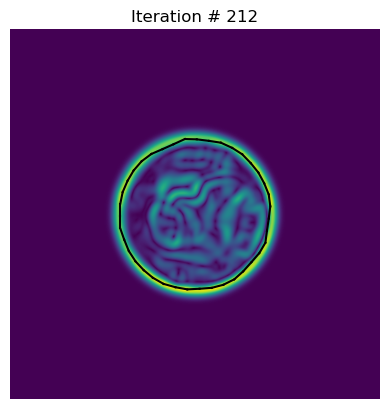

1590.0020601714539


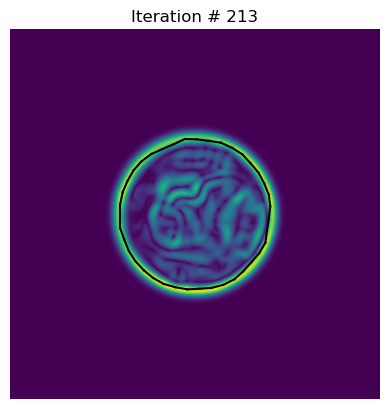

1588.910034526322


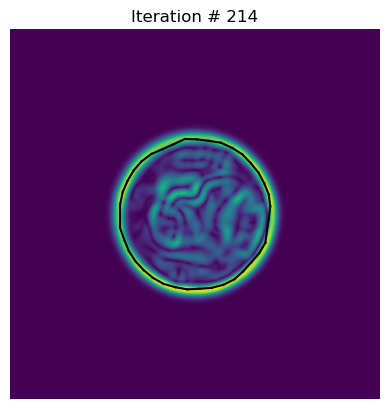

1590.0020601714539


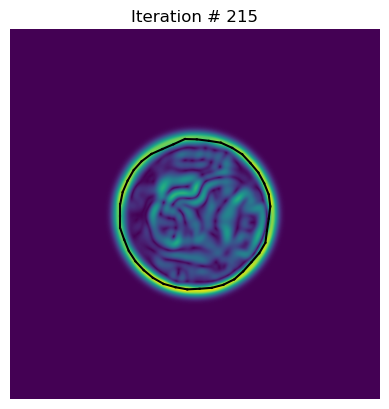

1588.910034526322


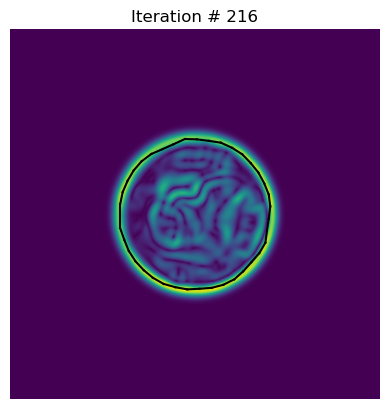

1590.0020601714539


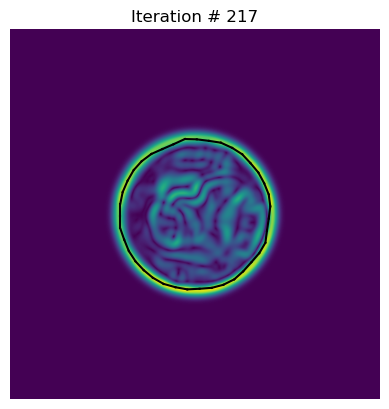

1588.910034526322


KeyboardInterrupt: 

In [137]:
win_hs         = 50 # window half size
thresh_motion  = 15
continue_snake = True
num_ctrl_pts   = 40
iteration      = 0
alpha, beta    = 0.0000001, 0
start_a_b_after= 0 # start after iteration #

while continue_snake:
    
    contour_s.find_minimum_on_wind(win_hs, edges, alpha, beta, start_a_b_after, iteration)        
    tot_motion = contour_s.compute_total_motion()
    
    print(tot_motion)
    
    fig = contour_s.plot_contour(edges)
    plt.title(f"Iteration # {iteration+1}")
    plt.show()
    
    if tot_motion < thresh_motion:
        continue_snake = False
        contour_s.update_contour()

    else:
        contour_s.update_contour()
        contour_s  = contour_s.resample_contour(num_ctrl_pts, fixed_length=None)
        iteration +=1

In [ ]:
fig= contour_s.plot_contour(edges)
fig.show()